In [1]:
import os
import cmdstanpy
from cmdstanpy import CmdStanModel
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import describe, gaussian_kde, norm, expon
import multiprocessing
import seaborn as sns
import warnings
import time

In [2]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['font.size'] = 14

In [3]:
from thinning import sample_hawkes_process_thinning_true_vectorised
from utils import exp_kernel_vectorised, constant_background, plot_counting_process
from mle import log_likelihood
from utils import trace_plots, posterior_histograms, posterior_kdes_overlaid, stacked_credible_intervals

In [4]:
np.random.SeedSequence()

SeedSequence(
    entropy=295697850027095172319136463601288385743,
)

## Investigating the effects of missingness on Bayesian inference

Generating reproducible data

In [5]:
max_T = 400
num_samples = 10
hawkes_realisations = []

master_seed = 37789148086743724264404479032151903001
seed_seq_master = np.random.SeedSequence(master_seed)

for i in range(num_samples):

    child_seed = seed_seq_master.spawn(1)[0]

    hawkes_realisation = sample_hawkes_process_thinning_true_vectorised(max_T, constant_background, exp_kernel_vectorised, seed=child_seed)
    hawkes_realisations.append(hawkes_realisation)

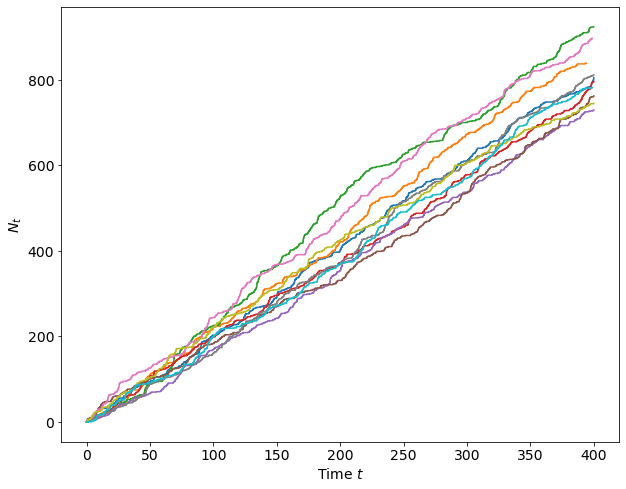

In [6]:
for h in hawkes_realisations:
    h = [0] + h
    counts = np.arange(len(h))
    plt.step(h, counts, where='post')
plt.xlabel("Time $t$")
plt.ylabel("$N_t$")
plt.show()

In [7]:
rng = np.random.default_rng(seed=master_seed)

random_label_lists = []

for realisation in hawkes_realisations:
    random_labels = rng.uniform(size=len(realisation))
    random_label_lists.append(random_labels)

In [8]:
def corrupt_realisation(realisation, random_labels, p, time_start=0, time_end=np.inf):
    return [t for t, rand_num in zip(realisation, random_labels) if rand_num < p or (t < time_start or t > time_end)]

Compiling Stan model

In [9]:
stan_file = os.path.join('.', 'models', 'exponential_priors_delta_only.stan')
model_compiled = CmdStanModel(stan_file=stan_file,
                                # If you want multi-thread option, need to recompile
                                cpp_options={'STAN_THREADS': 'TRUE'},
                                # turn off below to avoid recompiling
                                # force_compile=True
                                )

### p = 0.2

In [10]:
p = 0.2

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [11]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [12]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

17:46:41 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


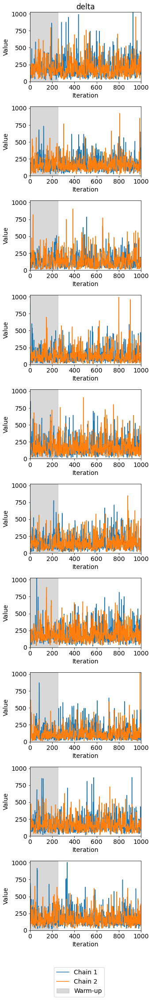

In [14]:
trace_plots(fits, ['delta'], warmup=warmup)

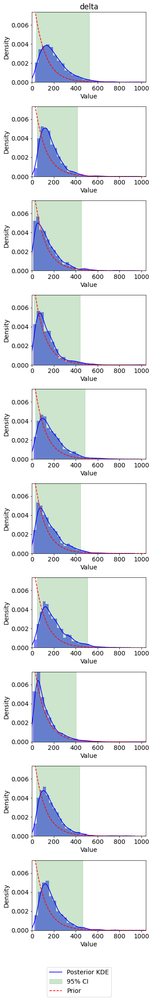

In [15]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

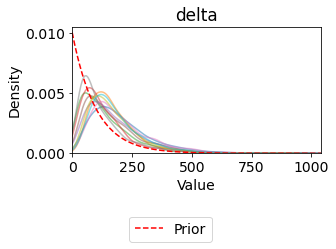

In [16]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

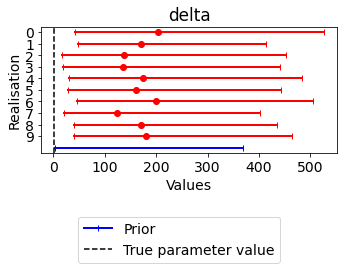

In [20]:
stacked_credible_intervals(fits, ['delta'], [2], [stats.expon.interval(0.95, scale=1/0.01)])

### p = 0.4

In [21]:
p = 0.4

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [22]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [23]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

17:48:19 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 4 divergent transitions (0.5%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
17:48:19 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
17:48:19 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
17:48:19 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 10 divergent transitions (1.3%)
	Chain 2 had 13 divergent transitions (1.7%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
17:48:19 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transit

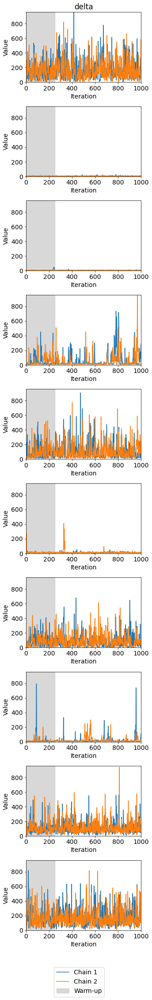

In [24]:
trace_plots(fits, ['delta'], warmup=warmup)

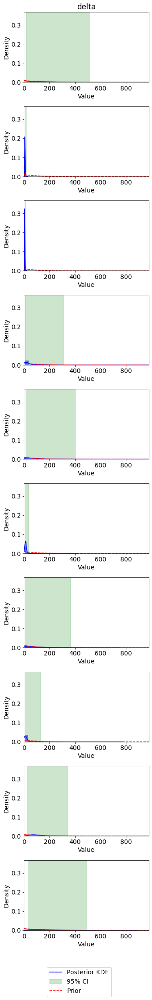

In [25]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

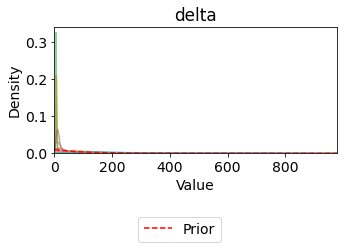

In [26]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

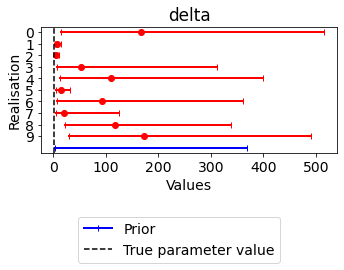

In [28]:
stacked_credible_intervals(fits, ['delta'], [2], [stats.expon.interval(0.95, scale=1/0.01)])

### p = 0.6

In [29]:
p = 0.6

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [30]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [31]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

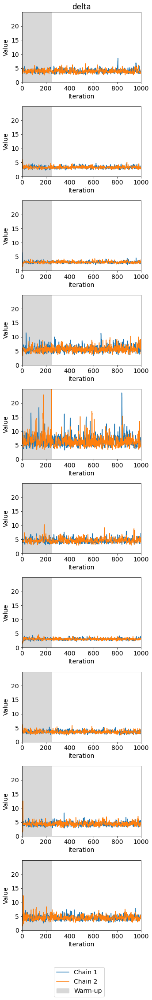

In [33]:
trace_plots(fits, ['delta'], warmup=warmup)

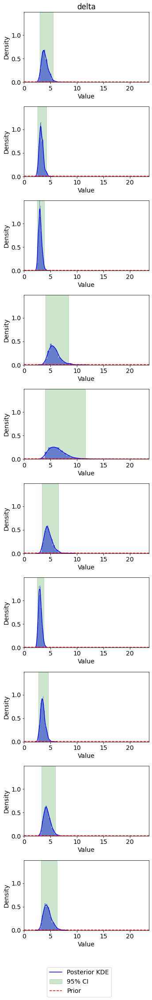

In [34]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

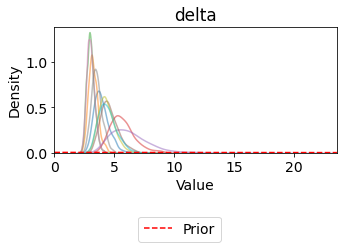

In [35]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

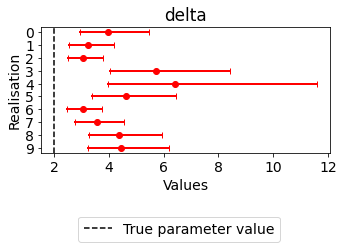

In [38]:
stacked_credible_intervals(fits, ['delta'], [2])
# stacked_credible_intervals(fits, ['delta'], [2], [stats.expon.interval(0.95, scale=1/0.01)])

### p = 0.8

In [39]:
p = 0.8

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [40]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [41]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

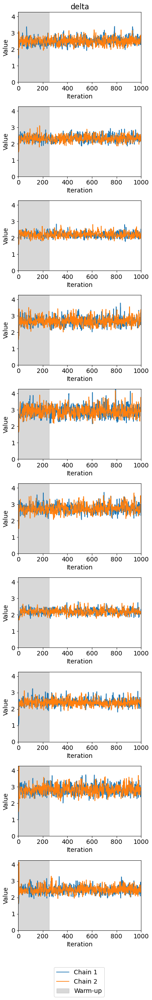

In [43]:
trace_plots(fits, ['delta'], warmup=warmup)

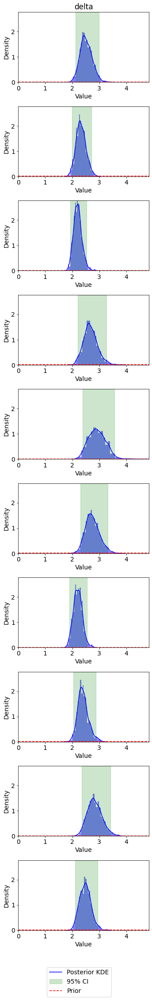

In [44]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

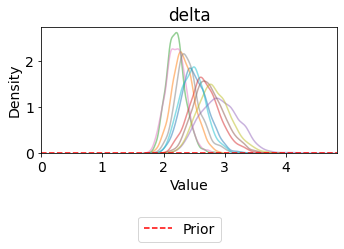

In [45]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

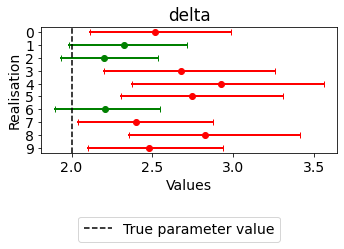

In [46]:
stacked_credible_intervals(fits, ['delta'], [2])

### p = 1

In [47]:
p = 1

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [48]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [49]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

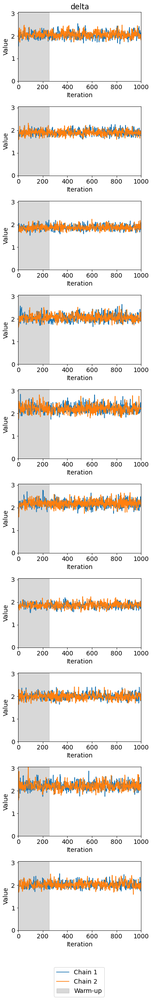

In [50]:
trace_plots(fits, ['delta'], warmup=warmup)

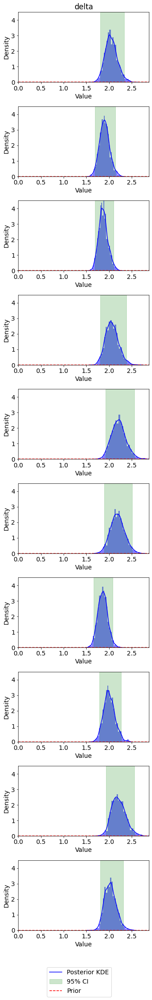

In [51]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

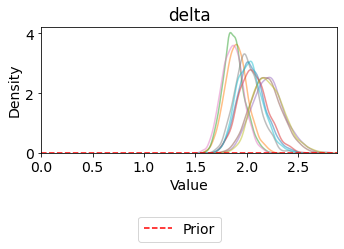

In [52]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

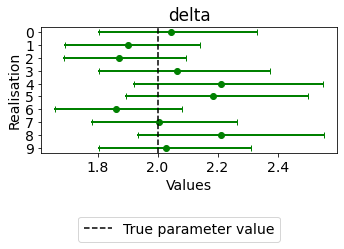

In [53]:
stacked_credible_intervals(fits, ['delta'], [2])

## Summary

Now plotted together

18:05:45 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 4 divergent transitions (0.5%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


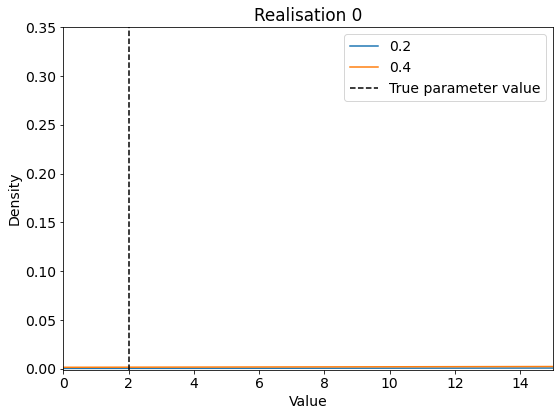

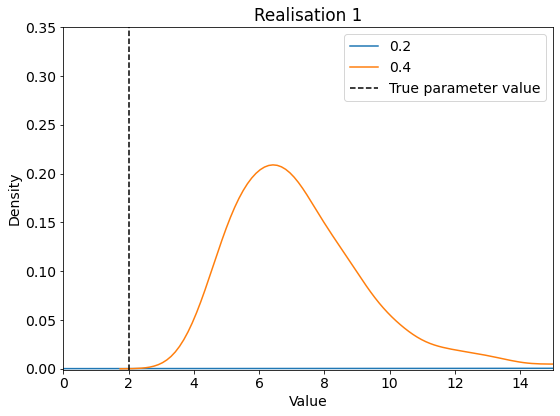

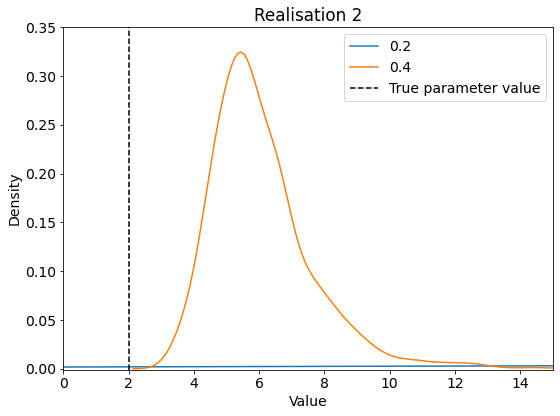

18:05:45 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


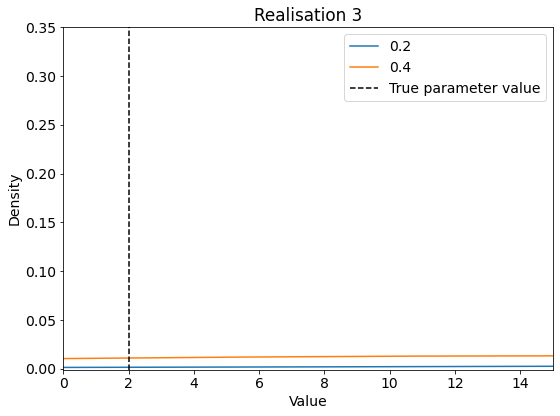

18:05:46 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


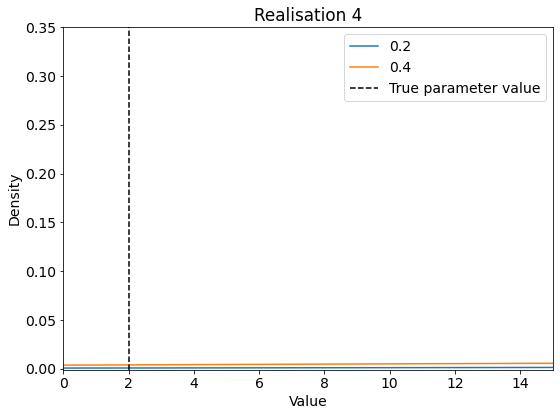

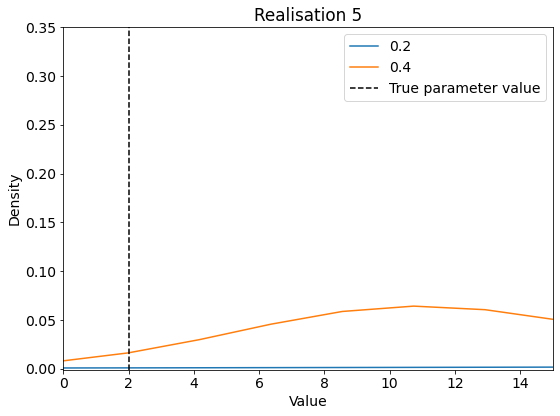

18:05:46 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 10 divergent transitions (1.3%)
	Chain 2 had 13 divergent transitions (1.7%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


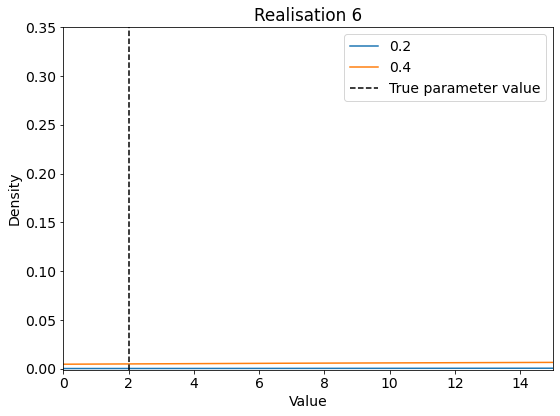

18:05:46 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:05:46 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


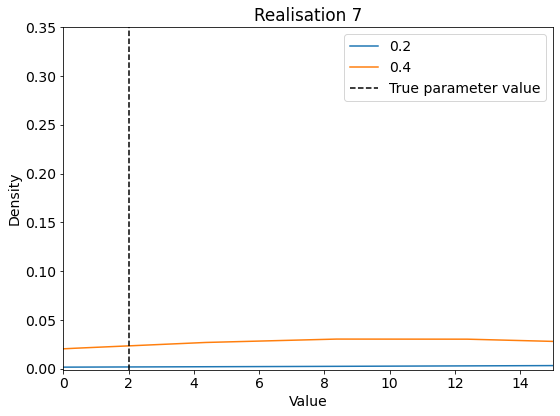

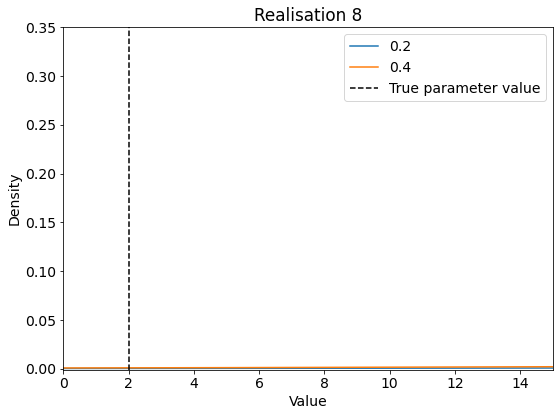

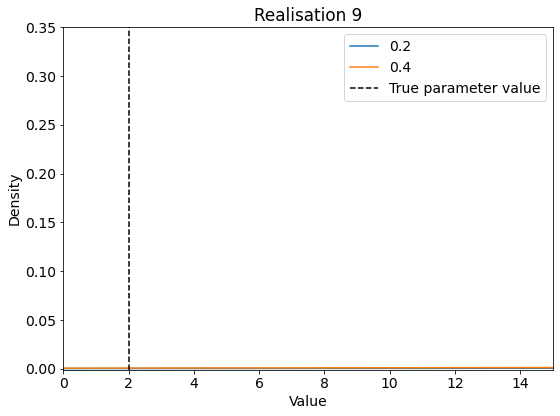

In [85]:
# save_plot_dir = r"C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\plots\bayesian\incr_obs_period"
for j in range(10):
    fig, ax = plt.subplots(figsize=(8, 6))
    for i, p in enumerate([0.2, 0.4]):
        save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        df = fit.draws_pd('delta')
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)
            sns.kdeplot(df.squeeze(), ax=ax, label=p, alpha=1)
    ax.set_xlabel('Value')
    ax.set_title(f"Realisation {j}")
    plt.xlim(0, 15)
    plt.ylim(-.001,0.35)
    plt.axvline(2, color='black', linestyle='--', label='True parameter value')
    plt.legend()
    plt.tight_layout()
    # save_plot_path = os.path.join(save_plot_dir, f"realisation_{j}_kde.png")
    # plt.savefig(save_plot_path)
    plt.show()
    plt.close(fig)

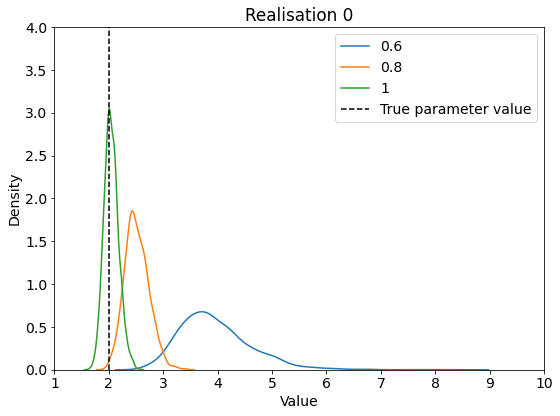

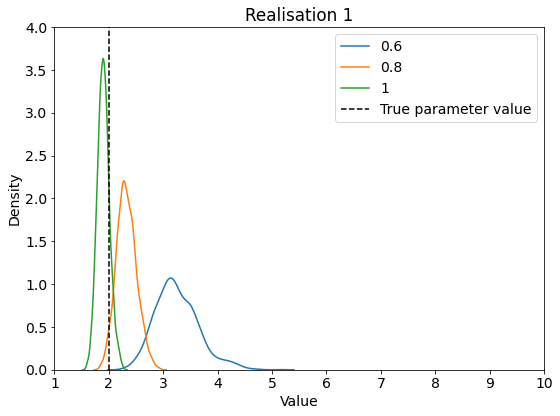

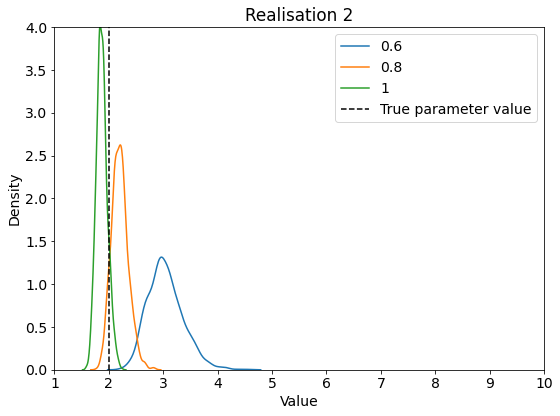

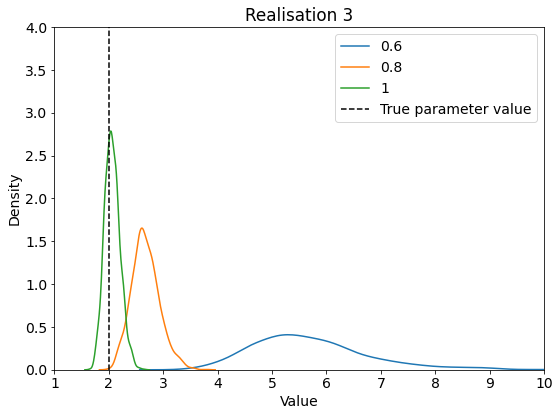

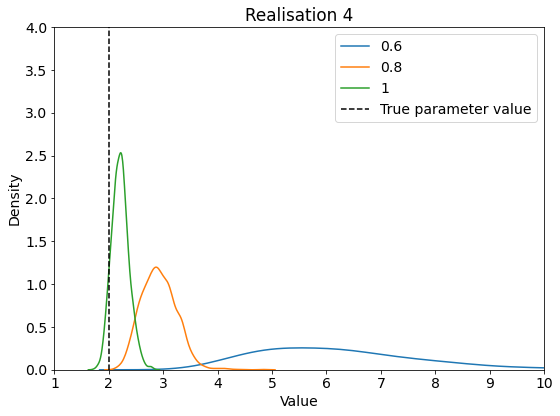

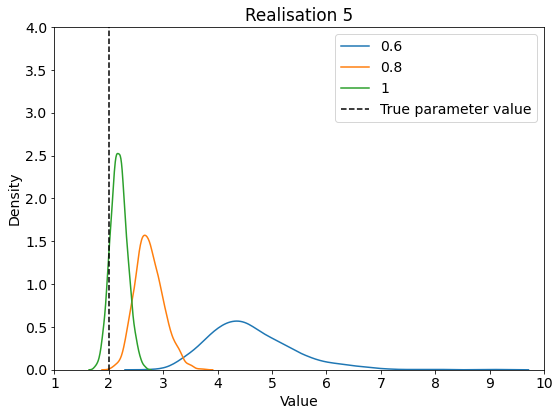

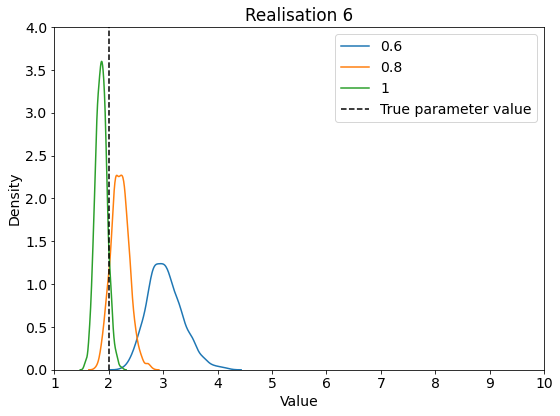

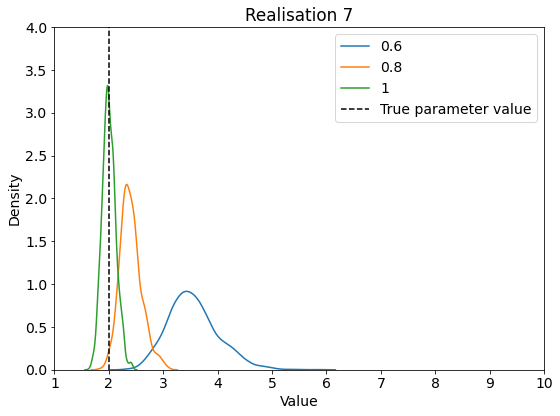

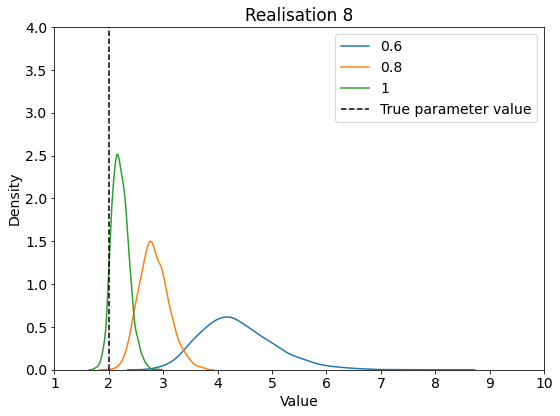

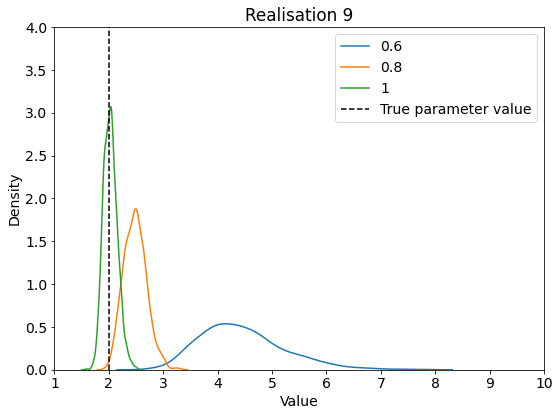

In [174]:
# save_plot_dir = r"C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\plots\bayesian\incr_obs_period"
for j in range(10):
    fig, ax = plt.subplots(figsize=(8, 6))
    for i, p in enumerate([0.6, 0.8, 1]):
        save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        df = fit.draws_pd('delta')
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)
            sns.kdeplot(df.squeeze(), ax=ax, label=p, alpha=1)
    ax.set_xlabel('Value')
    ax.set_title(f"Realisation {j}")
    plt.xlim(1, 10)
    plt.ylim(0,4)
    plt.axvline(2, color='black', linestyle='--', label='True parameter value')
    plt.legend()
    plt.tight_layout()
    # save_plot_path = os.path.join(save_plot_dir, f"realisation_{j}_kde.png")
    # plt.savefig(save_plot_path)
    plt.show()
    plt.close(fig)

18:06:26 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:06:26 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 4 divergent transitions (0.5%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:06:26 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:06:26 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:06:26 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 10 divergent transitions (1.3%)
	Chain 2 had 13 divergent transit

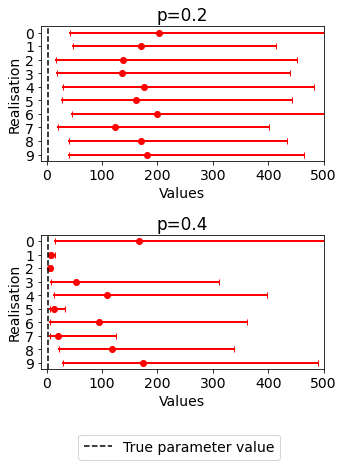

In [86]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(5, 3*2))

for i, p in enumerate([0.2,0.4]):
    save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
    axs_temp = axs[i]
    for j in range(10):
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        data = fit.draws_pd('delta')

        mean = np.mean(data)
        credible_interval = stats.mstats.mquantiles(data, [0.025, 0.975])

        if credible_interval[0] <= 2 <= credible_interval[1]:
            color_temp = 'green'
        else:
            color_temp = 'red'

        axs_temp.scatter(mean, j, color=color_temp)
        axs_temp.plot(credible_interval, [j, j], color=color_temp, linestyle='-', linewidth=2, marker='|')
    axs_temp.axvline(2, color='black', linestyle='--', label='True parameter value')
    axs_temp.invert_yaxis()
    axs_temp.set_title(f"p={p}")
    axs_temp.set_xlabel('Values')
    axs_temp.set_yticks(np.arange(10))
    axs_temp.set_ylabel('Realisation')
    axs_temp.set_xlim(-10, 500)
handles, labels = axs_temp.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.52, -0.01), ncol=1)
    
plt.tight_layout()
plt.show()

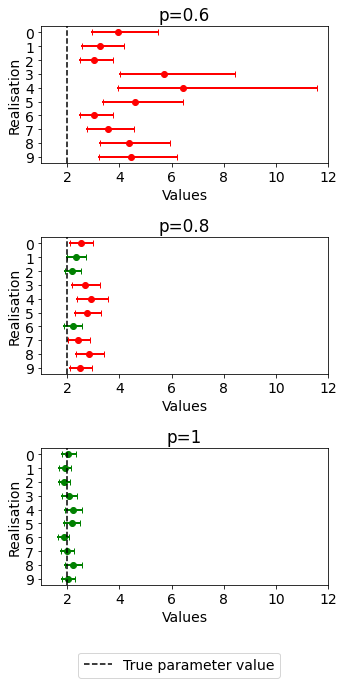

In [176]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(5, 3*3))

for i, p in enumerate([0.6, 0.8, 1]):
    save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
    axs_temp = axs[i]
    for j in range(10):
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        data = fit.draws_pd('delta')

        mean = np.mean(data)
        credible_interval = stats.mstats.mquantiles(data, [0.025, 0.975])

        if credible_interval[0] <= 2 <= credible_interval[1]:
            color_temp = 'green'
        else:
            color_temp = 'red'

        axs_temp.scatter(mean, j, color=color_temp)
        axs_temp.plot(credible_interval, [j, j], color=color_temp, linestyle='-', linewidth=2, marker='|')
    axs_temp.axvline(2, color='black', linestyle='--', label='True parameter value')
    axs_temp.invert_yaxis()
    axs_temp.set_title(f"p={p}")
    axs_temp.set_xlabel('Values')
    axs_temp.set_yticks(np.arange(10))
    axs_temp.set_ylabel('Realisation')
    axs_temp.set_xlim(1, 12)
handles, labels = axs_temp.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.52, -0.01), ncol=1)
    
plt.tight_layout()
plt.show()

## Now without alpha and mu fixed

In [88]:
param_strings = ['mu', 'alpha', 'delta']                 

In [89]:
stan_file = os.path.join('.', 'models', 'exponential_priors.stan')
model_compiled = CmdStanModel(stan_file=stan_file,
                                # If you want multi-thread option, need to recompile
                                cpp_options={'STAN_THREADS': 'TRUE'},
                                # turn off below to avoid recompiling
                                # force_compile=True
                                )

In [95]:
mu_prior = lambda x: expon.pdf(x, scale=1/0.01)
alpha_prior = lambda x: expon.pdf(x, scale=1/0.01)
delta_prior = lambda x: expon.pdf(x, scale=1/0.01)

prior_funcs = [mu_prior, alpha_prior, delta_prior]

In [96]:
mu_prior_ci = stats.expon.interval(0.95, scale=1/0.01)
alpha_prior_ci = stats.expon.interval(0.95, scale=1/0.01)
delta_prior_ci = stats.expon.interval(0.95, scale=1/0.01)

prior_cis = [mu_prior_ci, alpha_prior_ci, delta_prior_ci]

### p = 0.2

In [90]:
p = 0.2

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [91]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [92]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

18:07:10 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:07:10 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:07:10 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


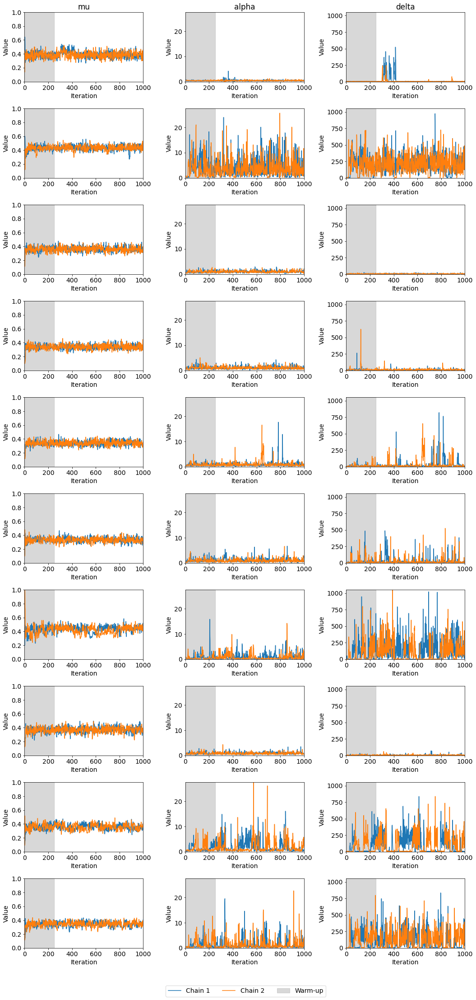

In [93]:
trace_plots(fits, param_strings, warmup=warmup)

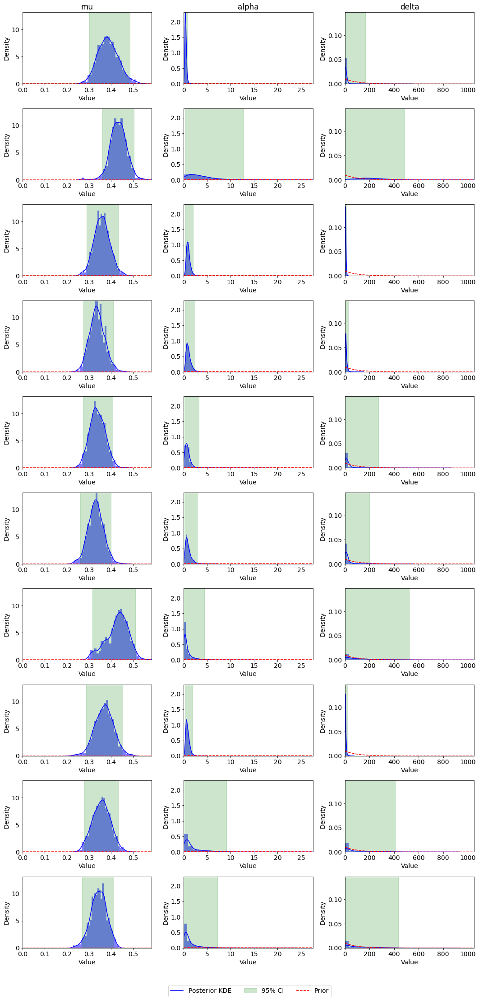

In [97]:
posterior_histograms(fits, param_strings, prior_funcs)

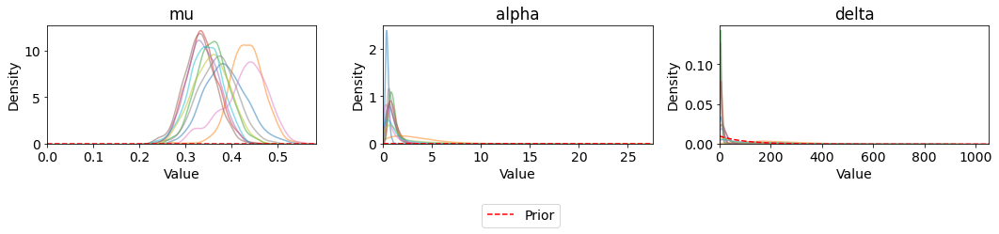

In [100]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

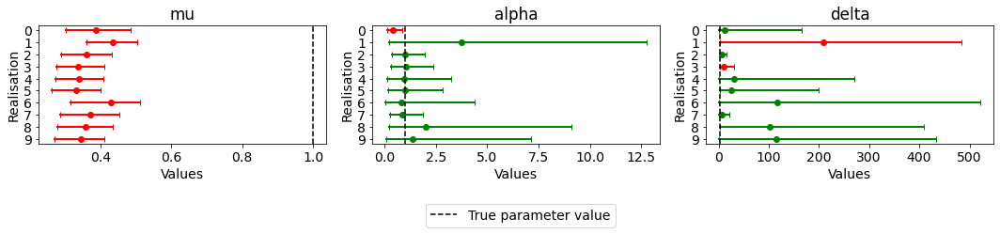

In [103]:
stacked_credible_intervals(fits, param_strings, [1,1,2])
# stacked_credible_intervals(fits, param_strings, [1,1,2], prior_cis)

### p = 0.4

In [104]:
p = 0.4

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [105]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [106]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

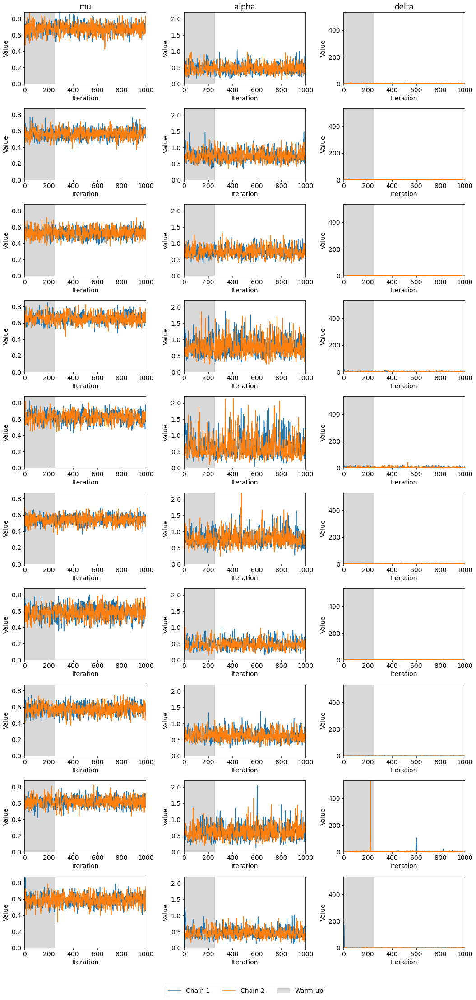

In [107]:
trace_plots(fits, param_strings, warmup=warmup)

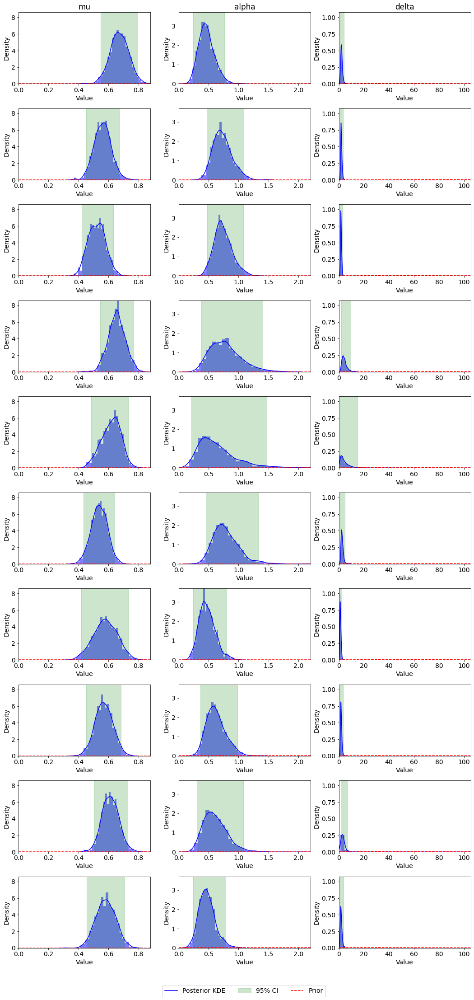

In [108]:
posterior_histograms(fits, param_strings, prior_funcs)

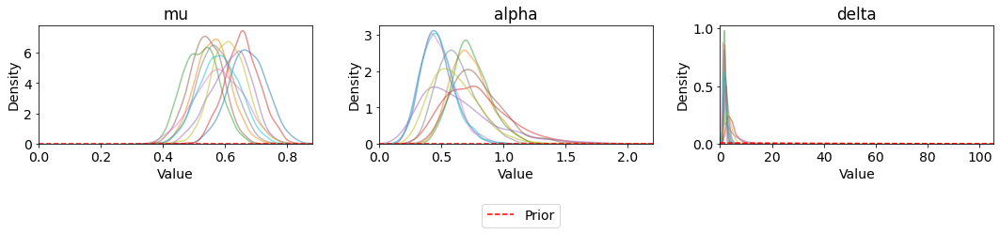

In [109]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

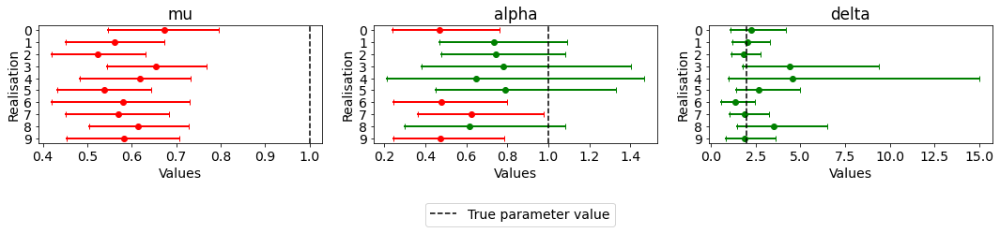

In [111]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

### p = 0.6

In [112]:
p = 0.6

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [113]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [114]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

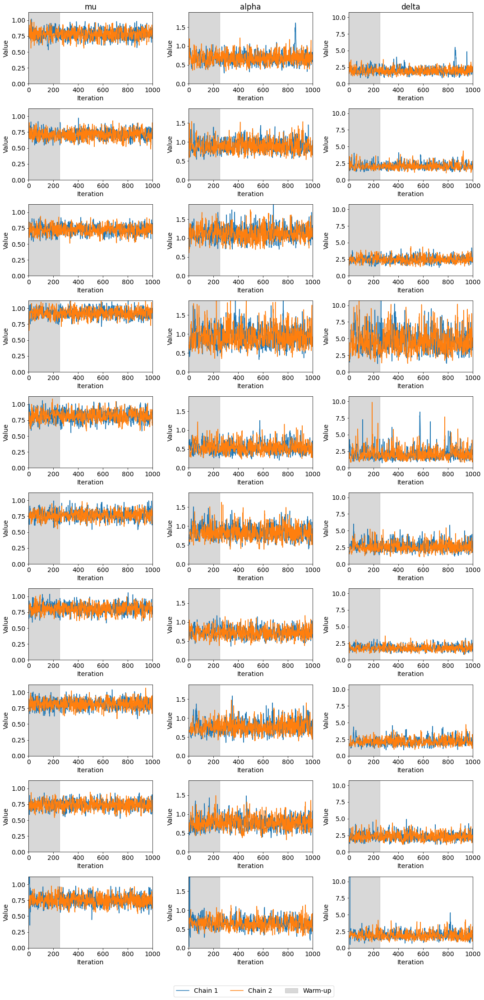

In [115]:
trace_plots(fits, param_strings, warmup=warmup)

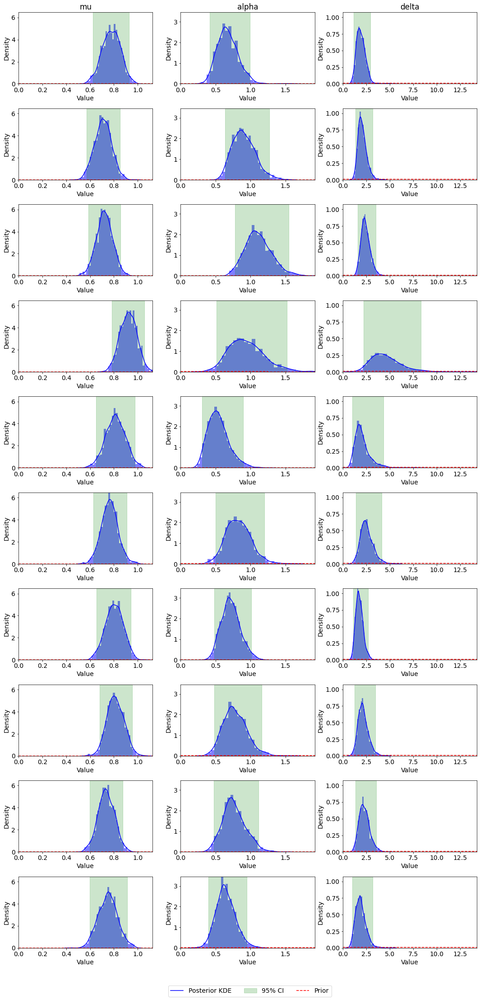

In [117]:
posterior_histograms(fits, param_strings, prior_funcs)

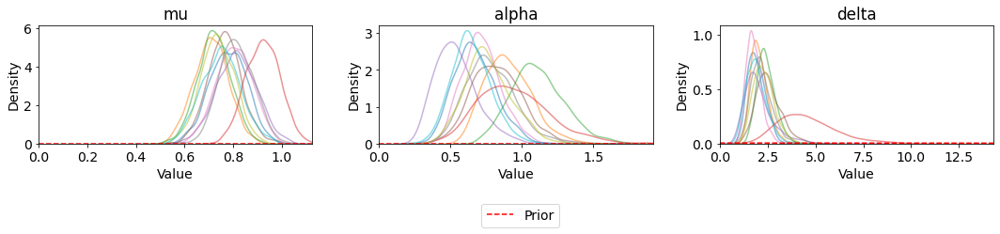

In [118]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

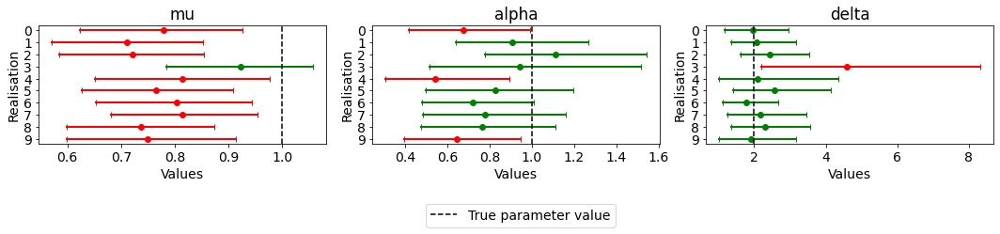

In [119]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

### p = 0.8

In [120]:
p = 0.8

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [121]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [122]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

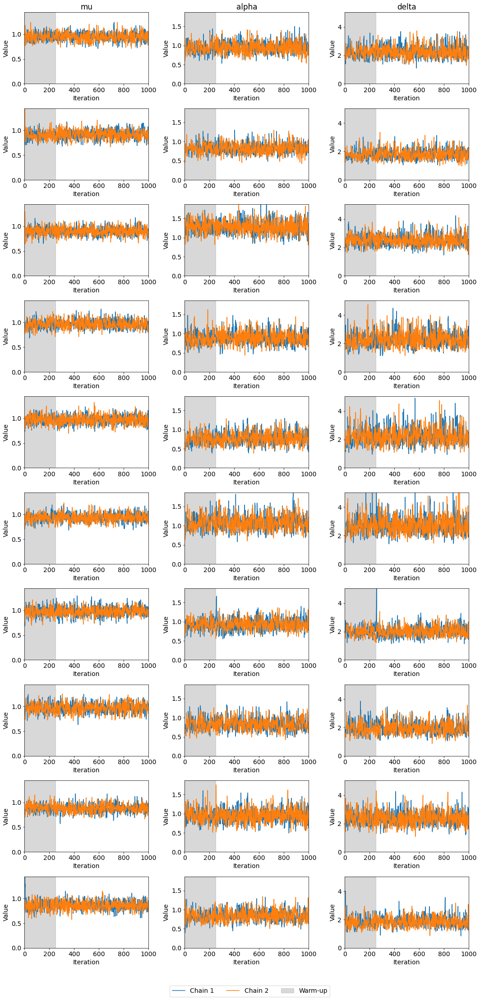

In [123]:
trace_plots(fits, param_strings, warmup=warmup)

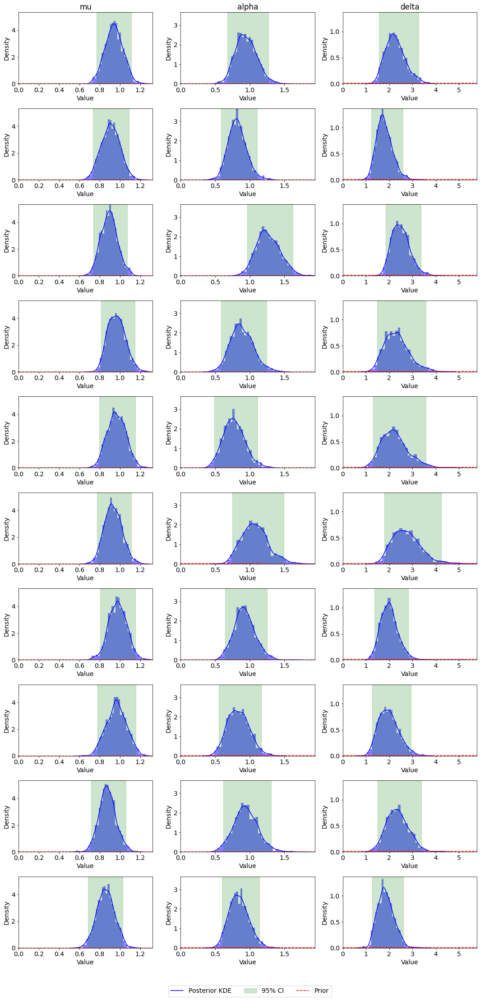

In [125]:
posterior_histograms(fits, param_strings, prior_funcs)

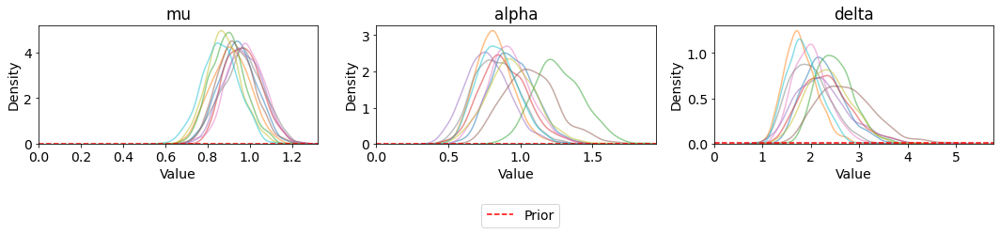

In [126]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

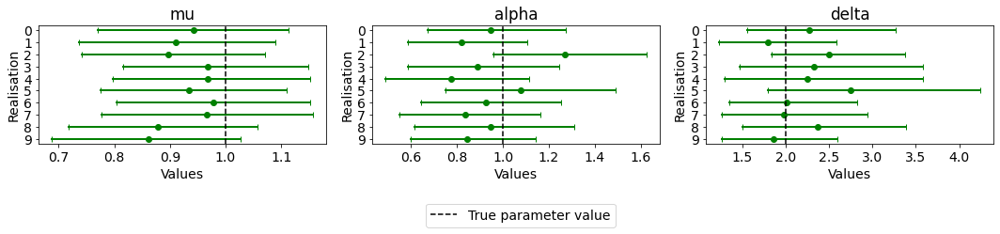

In [129]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

### p = 1

In [130]:
p = 1

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [131]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [132]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

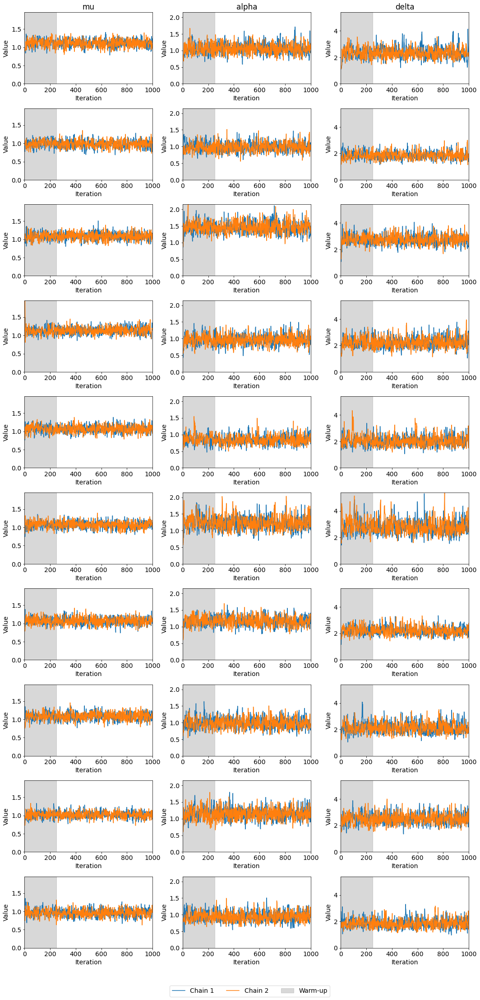

In [133]:
trace_plots(fits, param_strings, warmup=warmup)

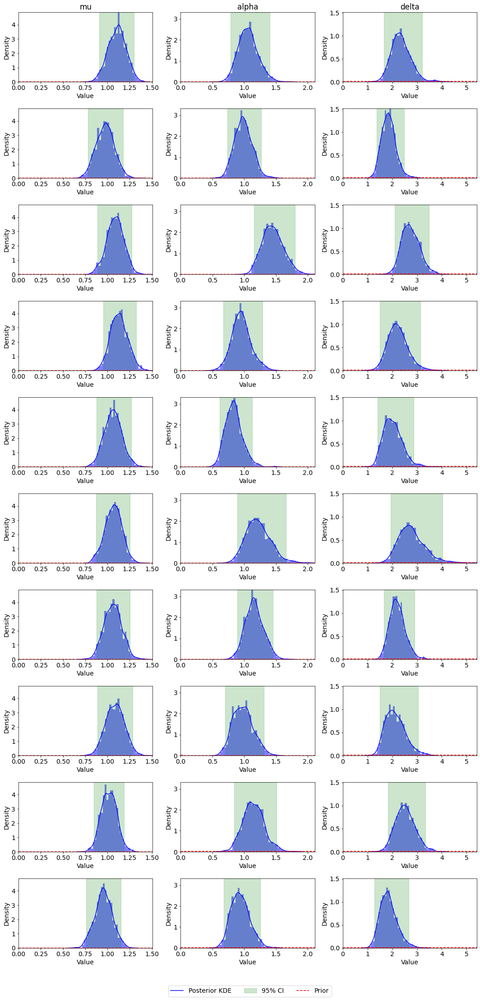

In [134]:
posterior_histograms(fits, param_strings, prior_funcs)

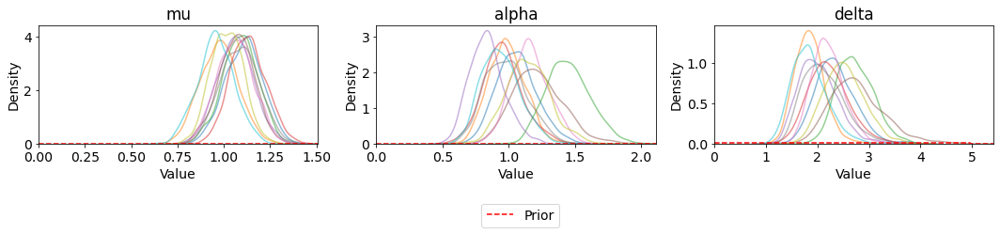

In [135]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

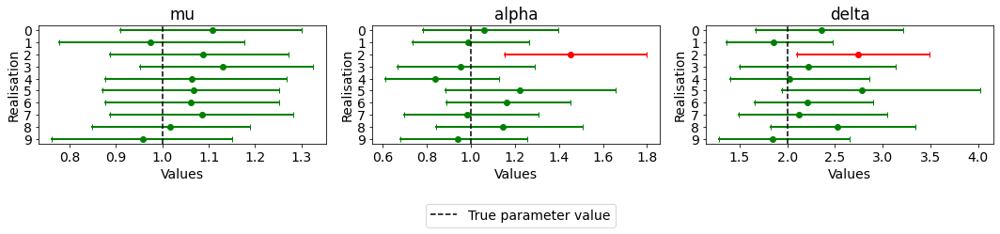

In [138]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

## Summary

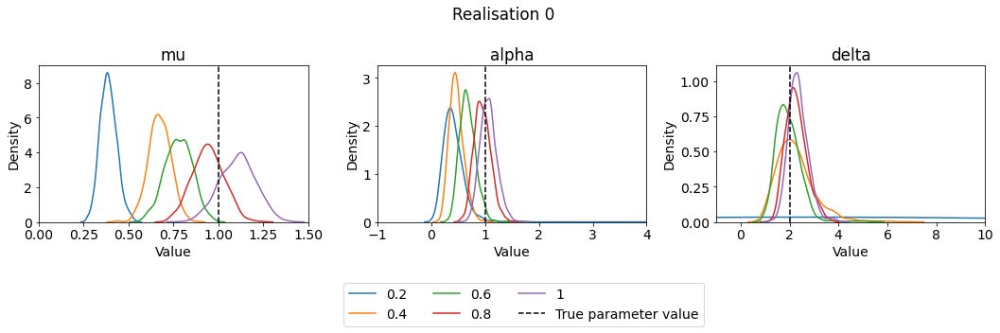

18:46:08 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:46:09 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:46:09 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


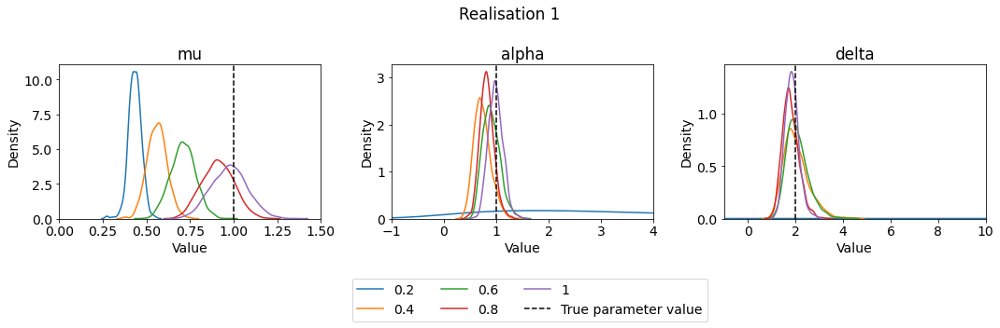

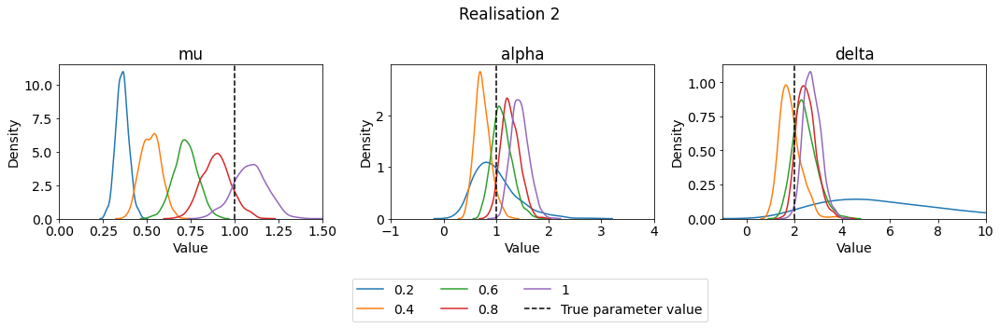

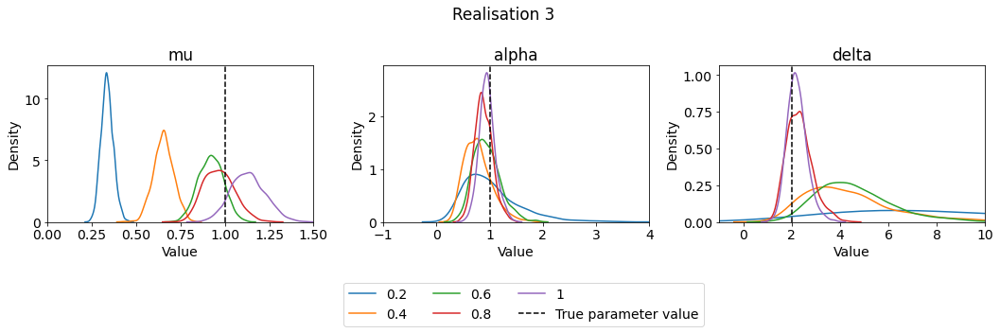

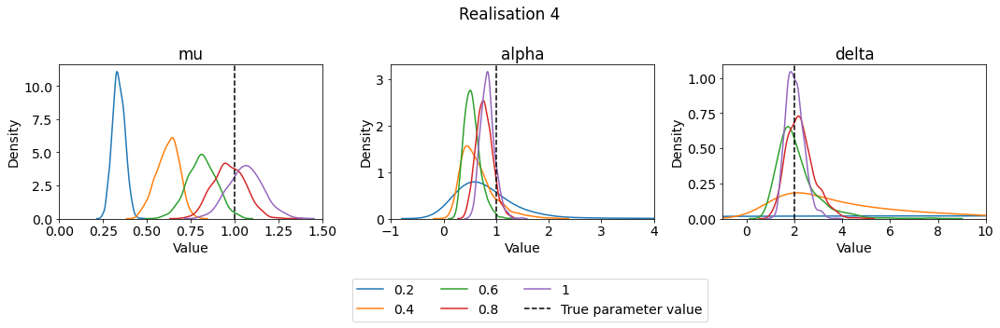

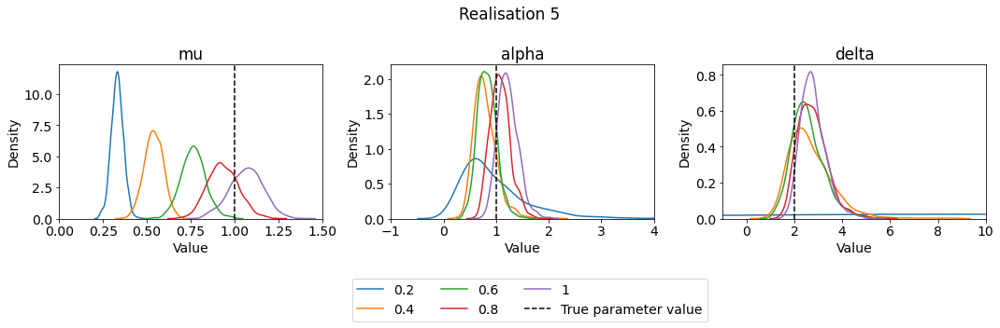

18:46:14 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:46:14 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:46:15 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


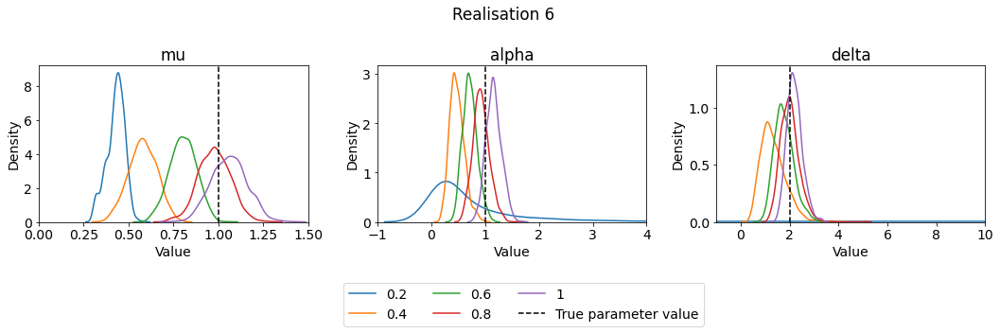

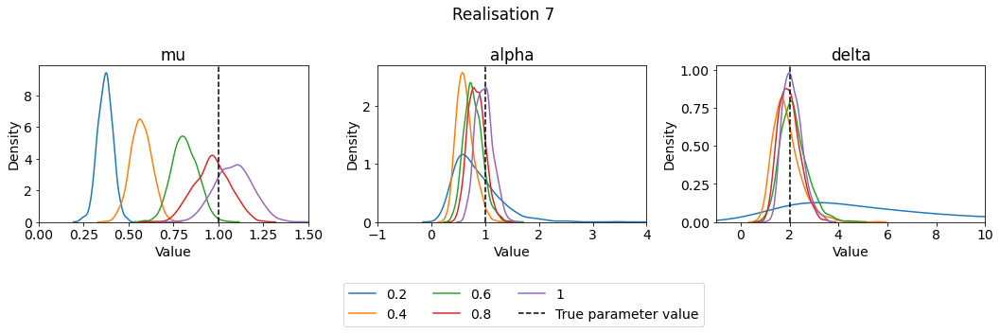

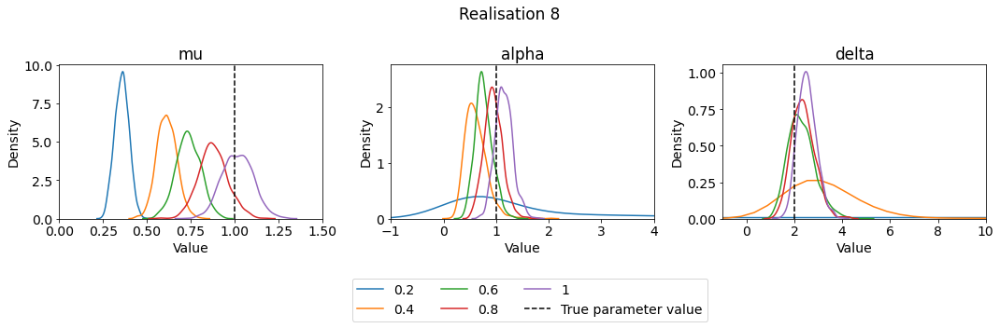

18:46:18 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:46:18 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:46:19 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


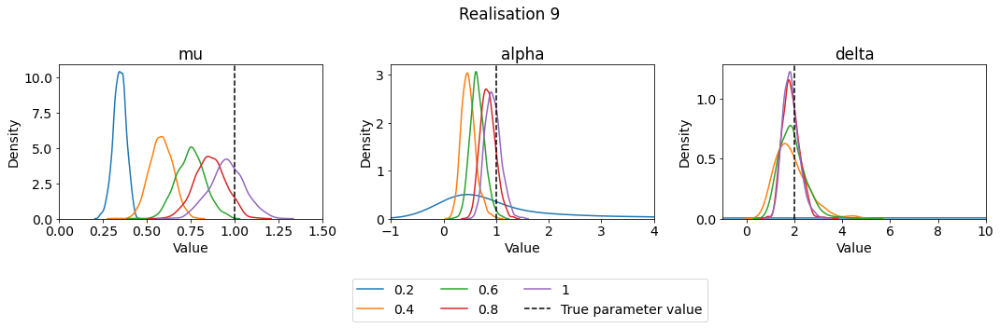

In [190]:
# save_plot_dir = r"C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\plots\bayesian\incr_obs_period"
true_values=[1,1,2]
xlims=[[0, 1.5], [-1, 4], [-1, 10]]

for j in range(10):
    fig, axs = plt.subplots(ncols=3, figsize=(5*3, 4))
    for k, param in enumerate(param_strings):
        ax = axs[k]
        for i, p in enumerate([0.2, 0.4, 0.6, 0.8, 1]):
            save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
            save_path = os.path.join(save_dir, f'realisation{j}')
            fit = cmdstanpy.from_csv(save_path)
            df = fit.draws_pd(param)
            with warnings.catch_warnings():
                warnings.simplefilter(action='ignore', category=FutureWarning)
                sns.kdeplot(df.squeeze(), ax=ax, label=p, alpha=1)
            ax.set_xlabel('Value')
            ax.set_title(f"{param}")
            # plt.xlim(1, 10)
            # plt.ylim(0,4)
        ax.axvline(true_values[k], color='black', linestyle='--', label='True parameter value')
        ax.set_xlim(xlims[k])
            
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.52, -0.01), ncol=3)
    plt.suptitle(f"Realisation {j}")
    plt.tight_layout()
    # save_plot_path = os.path.join(save_plot_dir, f"realisation_{j}_kde.png")
    # plt.savefig(save_plot_path)
    plt.show()
    plt.close(fig)

18:56:49 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:56:49 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:56:49 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


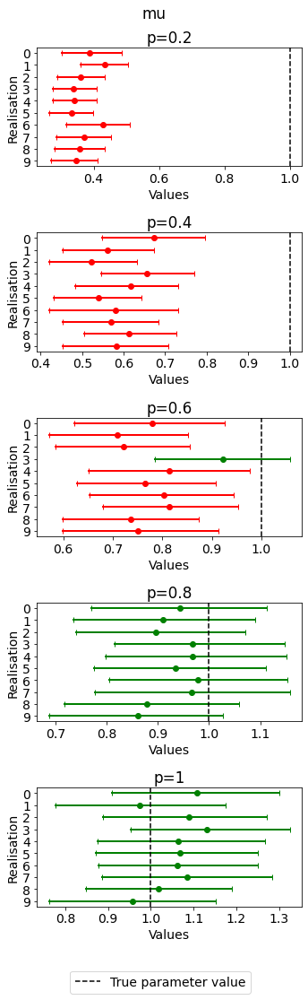

In [200]:
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(5, 3*5))

for i, p in enumerate([0.2, 0.4, 0.6, 0.8, 1]):
    save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
    axs_temp = axs[i]
    for j in range(10):
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        data = fit.draws_pd('mu')

        mean = np.mean(data)
        credible_interval = stats.mstats.mquantiles(data, [0.025, 0.975])

        if credible_interval[0] <= 1 <= credible_interval[1]:
            color_temp = 'green'
        else:
            color_temp = 'red'

        axs_temp.scatter(mean, j, color=color_temp)
        axs_temp.plot(credible_interval, [j, j], color=color_temp, linestyle='-', linewidth=2, marker='|')
    axs_temp.axvline(1, color='black', linestyle='--', label='True parameter value')
    axs_temp.invert_yaxis()
    axs_temp.set_title(f"p={p}")
    axs_temp.set_xlabel('Values')
    axs_temp.set_yticks(np.arange(10))
    axs_temp.set_ylabel('Realisation')
    # axs_temp.set_xlim(1, 12)
handles, labels = axs_temp.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.52, -0.01), ncol=1)
plt.suptitle('mu')
plt.tight_layout()
plt.show()

18:56:40 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:56:40 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:56:40 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


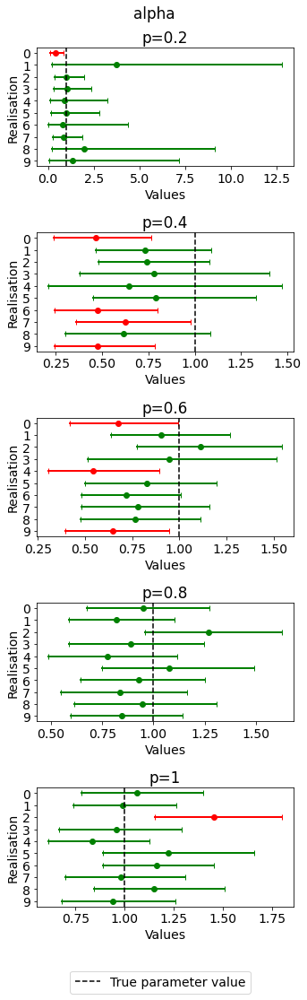

In [199]:
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(5, 3*5))

for i, p in enumerate([0.2, 0.4, 0.6, 0.8, 1]):
    save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
    axs_temp = axs[i]
    for j in range(10):
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        data = fit.draws_pd('alpha')

        mean = np.mean(data)
        credible_interval = stats.mstats.mquantiles(data, [0.025, 0.975])

        if credible_interval[0] <= 1 <= credible_interval[1]:
            color_temp = 'green'
        else:
            color_temp = 'red'

        axs_temp.scatter(mean, j, color=color_temp)
        axs_temp.plot(credible_interval, [j, j], color=color_temp, linestyle='-', linewidth=2, marker='|')
    axs_temp.axvline(1, color='black', linestyle='--', label='True parameter value')
    axs_temp.invert_yaxis()
    axs_temp.set_title(f"p={p}")
    axs_temp.set_xlabel('Values')
    axs_temp.set_yticks(np.arange(10))
    axs_temp.set_ylabel('Realisation')
    # axs_temp.set_xlim(1, 12)
handles, labels = axs_temp.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.52, -0.01), ncol=1)
plt.suptitle('alpha')
plt.tight_layout()
plt.show()

18:57:13 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:57:13 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
18:57:13 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


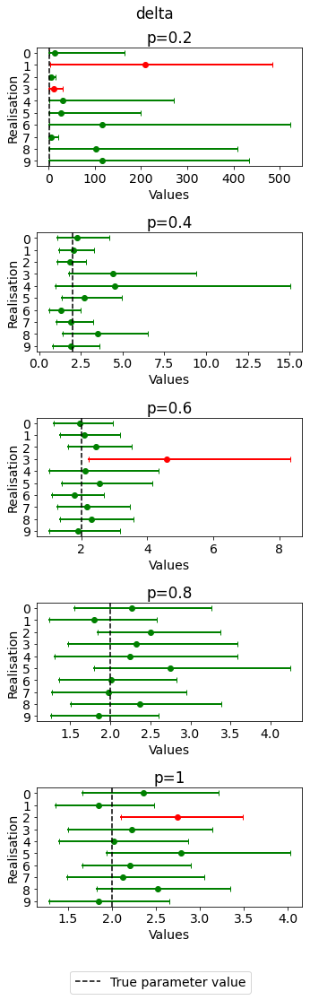

In [201]:
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(5, 3*5))

for i, p in enumerate([0.2, 0.4, 0.6, 0.8, 1]):
    save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
    axs_temp = axs[i]
    for j in range(10):
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        data = fit.draws_pd('delta')

        mean = np.mean(data)
        credible_interval = stats.mstats.mquantiles(data, [0.025, 0.975])

        if credible_interval[0] <= 2 <= credible_interval[1]:
            color_temp = 'green'
        else:
            color_temp = 'red'

        axs_temp.scatter(mean, j, color=color_temp)
        axs_temp.plot(credible_interval, [j, j], color=color_temp, linestyle='-', linewidth=2, marker='|')
    axs_temp.axvline(2, color='black', linestyle='--', label='True parameter value')
    axs_temp.invert_yaxis()
    axs_temp.set_title(f"p={p}")
    axs_temp.set_xlabel('Values')
    axs_temp.set_yticks(np.arange(10))
    axs_temp.set_ylabel('Realisation')
    # axs_temp.set_xlim(1, 12)
handles, labels = axs_temp.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.52, -0.01), ncol=1)
plt.suptitle('delta')
plt.tight_layout()
plt.show()

## Missingness at start and end

### At start

In [139]:
p=0.5

Do for different values of T_end

#### T_end=100

In [140]:
T_end=100

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [141]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [142]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

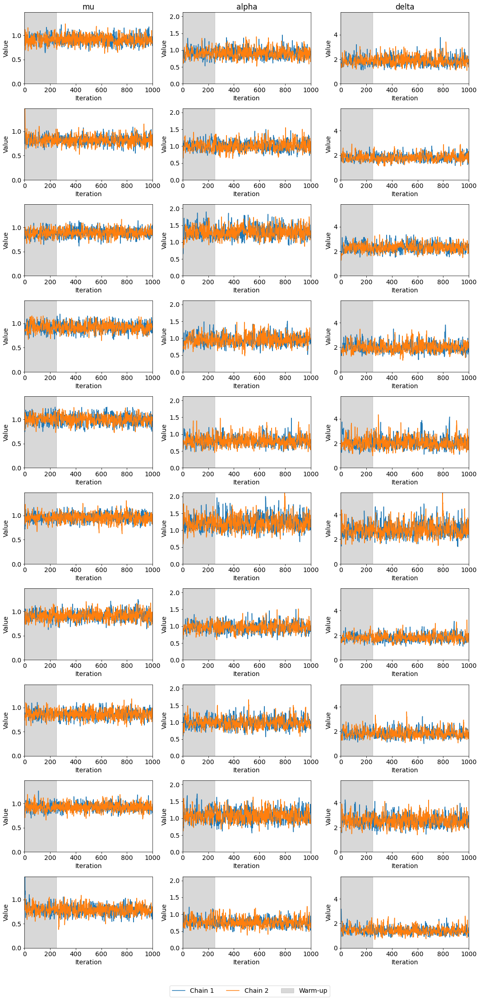

In [144]:
trace_plots(fits, param_strings, warmup=warmup)

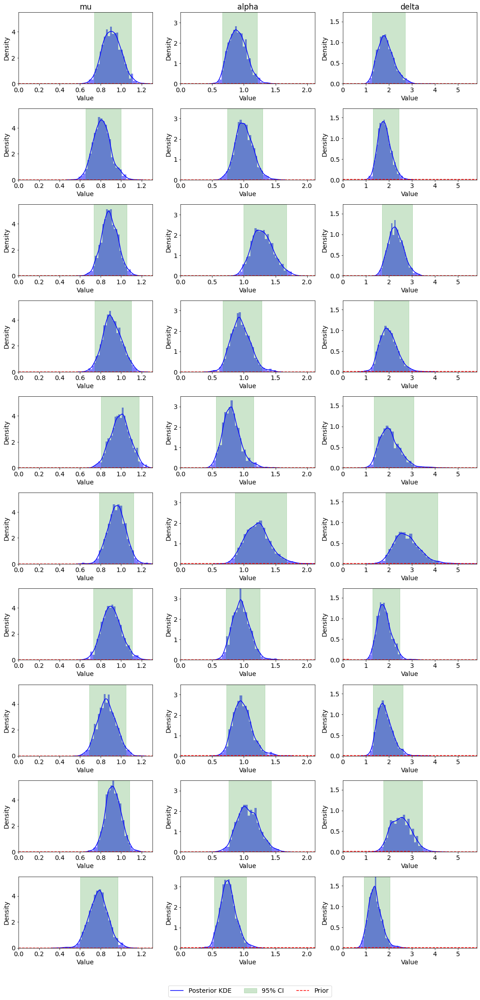

In [146]:
posterior_histograms(fits, param_strings, prior_funcs)

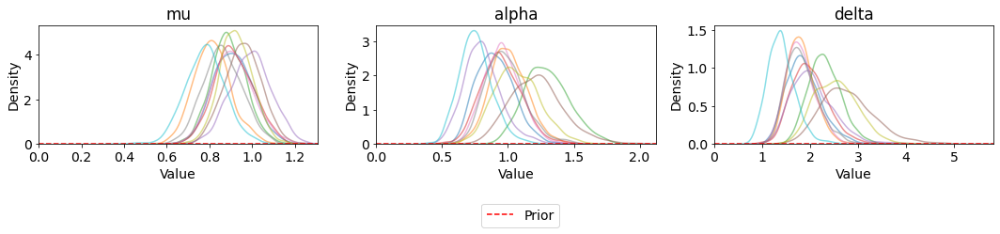

In [147]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

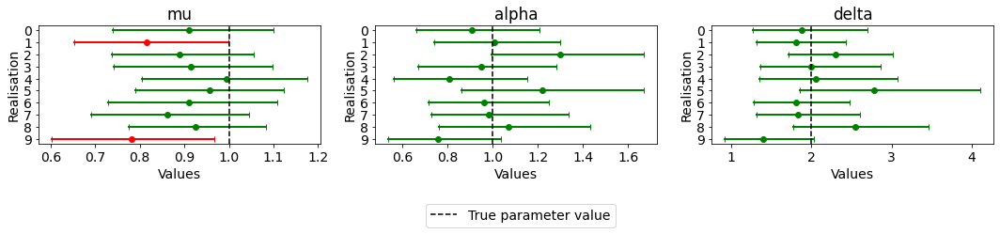

In [148]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_end=200

In [149]:
T_end=200

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [150]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [151]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

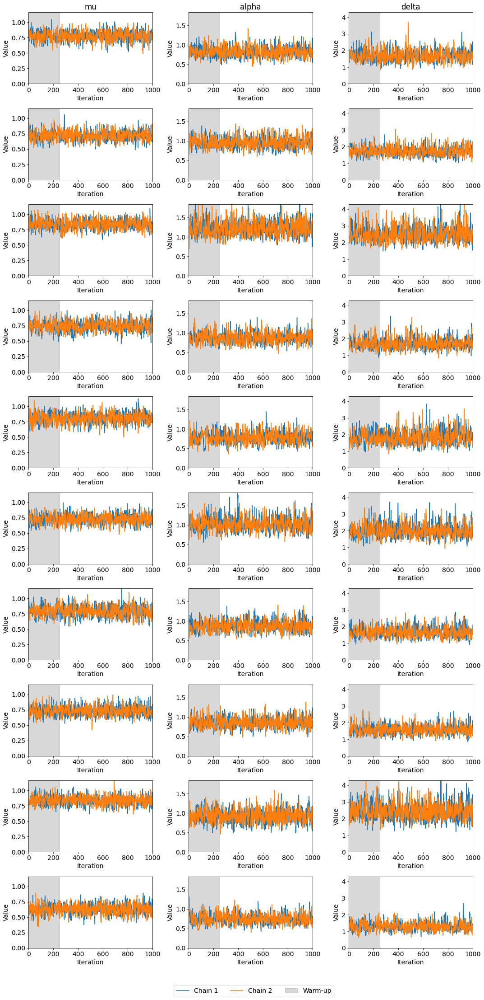

In [152]:
trace_plots(fits, param_strings, warmup=warmup)

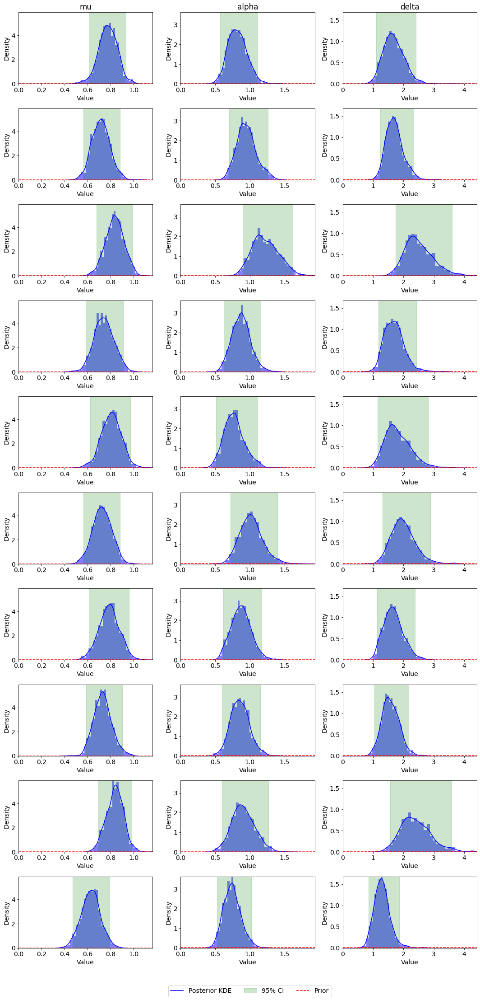

In [153]:
posterior_histograms(fits, param_strings, prior_funcs)

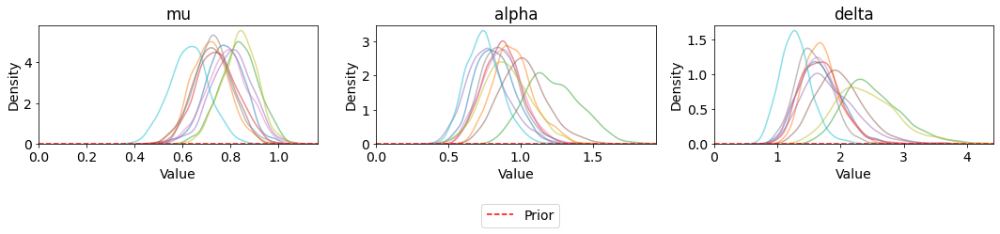

In [154]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

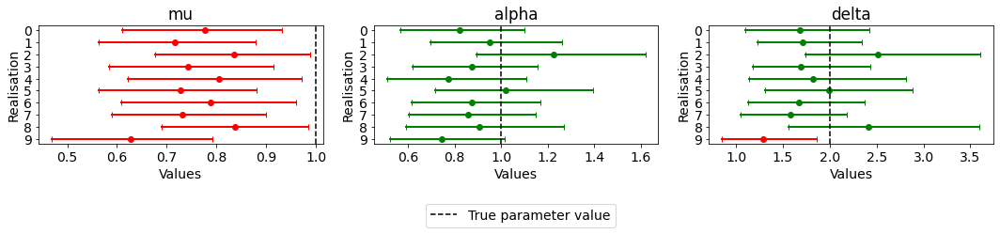

In [157]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_end=300

In [158]:
T_end=300

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [159]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [160]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

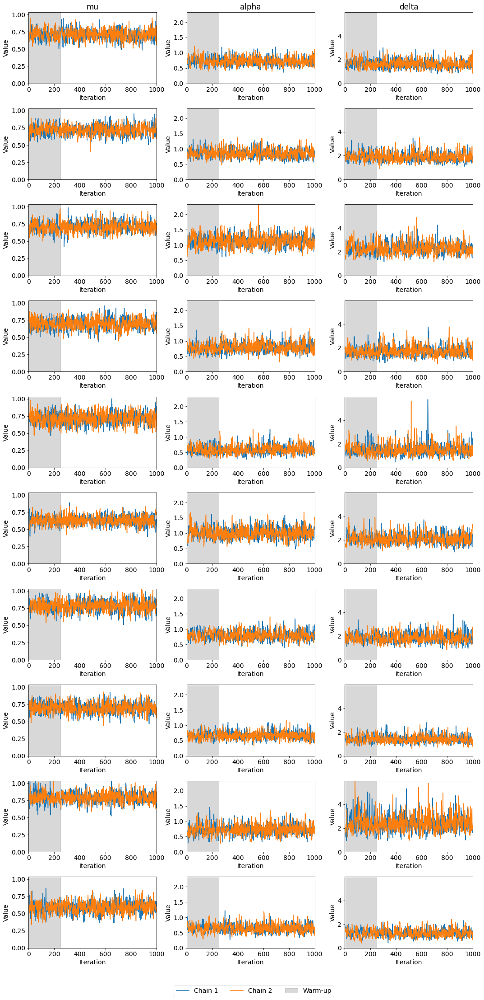

In [161]:
trace_plots(fits, param_strings, warmup=warmup)

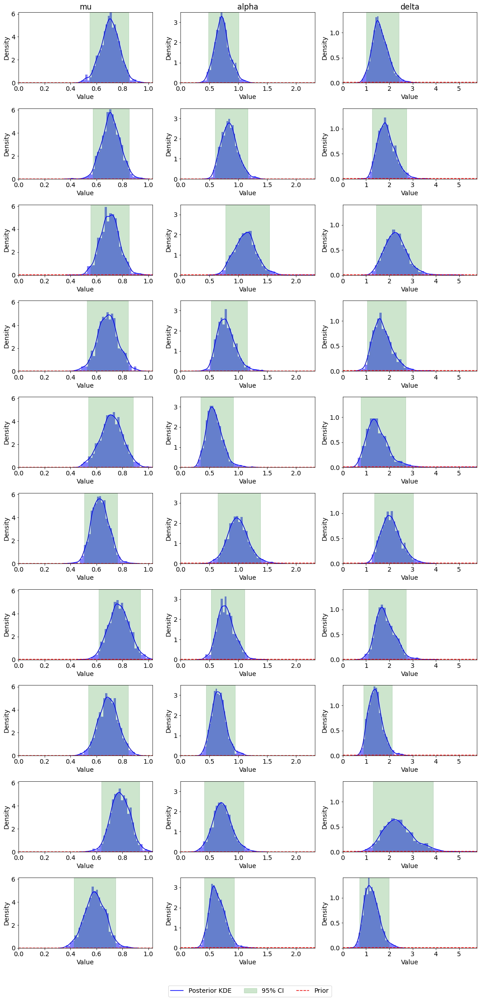

In [162]:
posterior_histograms(fits, param_strings, prior_funcs)

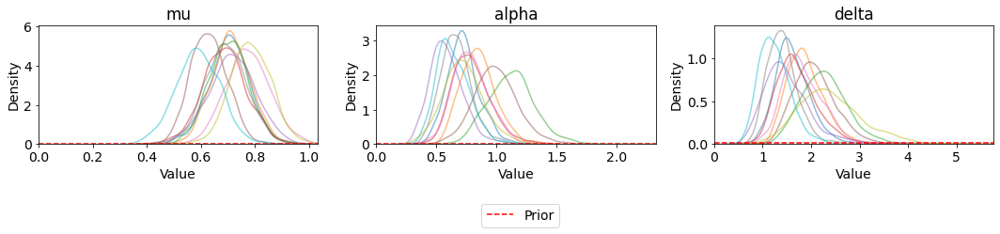

In [163]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

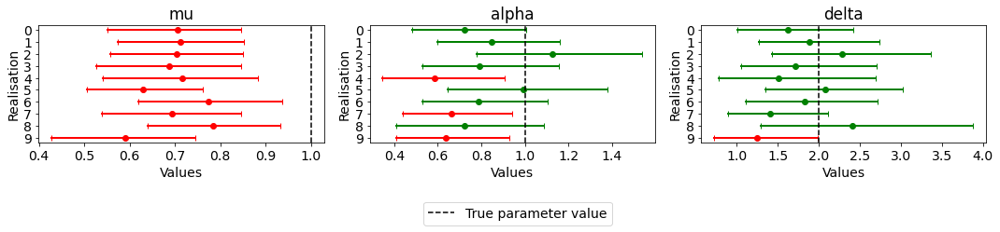

In [164]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_end=400

In [165]:
T_end=400

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [166]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

# for i in range(num_samples):
#     print(f"MCMC sampling for realisation {i}")

#     child_seed_stan = seed_seq_master_stan.spawn(1)[0]

#     # Create a random number generator using the seed
#     rng = np.random.default_rng(child_seed_stan)
    
#     # Generate random integers less than 2**32 - 1
#     child_seed = rng.integers(2**32 - 1)
#     print(f"Child seed used = {child_seed}")

#     save_path = os.path.join(save_dir, f"realisation{i}")
#     print(f"Saving to {save_path}")

#     fit = model_compiled.sample(data=data_list[i],
#                                 seed=child_seed,
#                                 chains=2,
#                                 parallel_chains=2,
#                                 iter_warmup=warmup,
#                                 iter_sampling=3*warmup,
#                                 inits="0",
#                                 save_warmup=True,
#                                 output_dir=save_path)
    
#     fits.append(fit)

In [168]:
for i in range(num_samples):
    save_path = os.path.join(save_dir, f"realisation{i}")
    fit = cmdstanpy.from_csv(save_path)
    fits.append(fit)

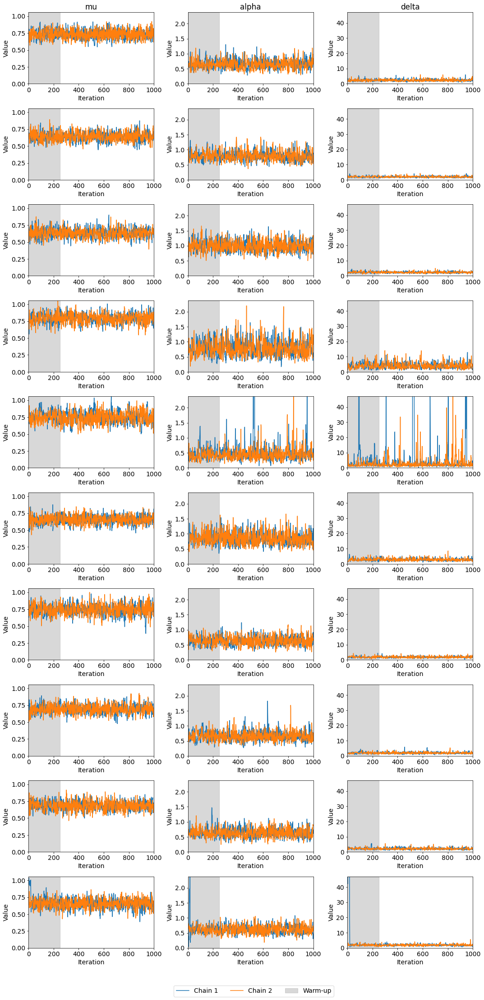

In [169]:
trace_plots(fits, param_strings, warmup=warmup)

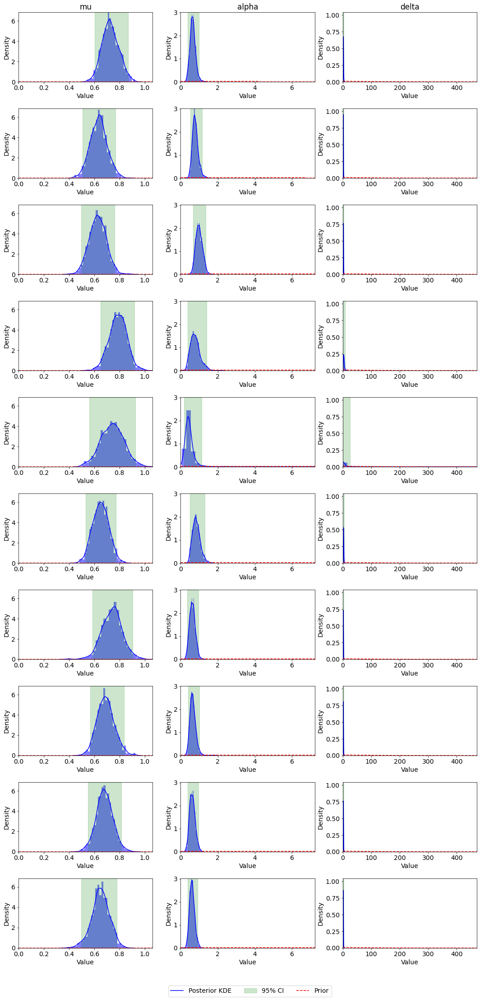

In [170]:
posterior_histograms(fits, param_strings, prior_funcs)

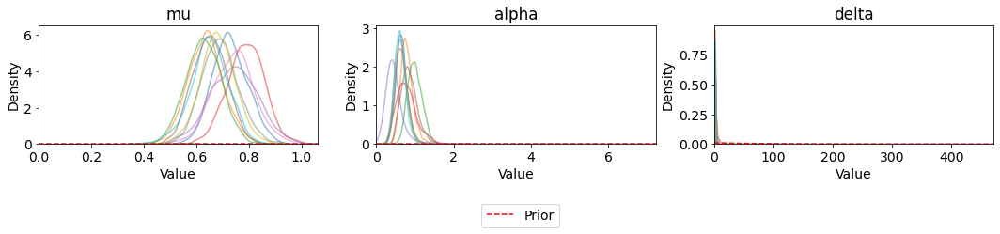

In [172]:
posterior_kdes_overlaid(fits, param_strings, prior_funcs)

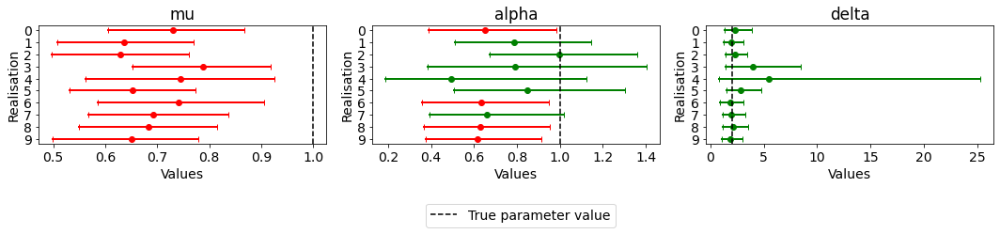

In [173]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

Now need to do the same for missingness at end. (And also plot above each realisation as T_end varies).

### At end

Now we fix T_end=max_T=400 and vary T_start

#### T_start=100

In [181]:
T_start=100

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [183]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

22:08:08 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation0
22:08:08 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:13:01 - cmdstanpy - INFO - CmdStan done processing.
22:13:01 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation1



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation1


22:13:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:18:40 - cmdstanpy - INFO - CmdStan done processing.



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation2


22:18:41 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation2
22:18:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:25:28 - cmdstanpy - INFO - CmdStan done processing.
22:25:28 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation3
22:25:28 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:31:26 - cmdstanpy - INFO - CmdStan done processing.
22:31:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation4



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation4


22:31:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:35:28 - cmdstanpy - INFO - CmdStan done processing.
22:35:28 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation5
22:35:28 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:39:43 - cmdstanpy - INFO - CmdStan done processing.
22:39:44 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation6
22:39:44 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:46:26 - cmdstanpy - INFO - CmdStan done processing.
22:46:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation7
22:46:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:50:41 - cmdstanpy - INFO - CmdStan done processing.
22:50:41 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation8



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation8


22:50:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:55:45 - cmdstanpy - INFO - CmdStan done processing.
22:55:45 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation9
22:55:45 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

23:00:43 - cmdstanpy - INFO - CmdStan done processing.


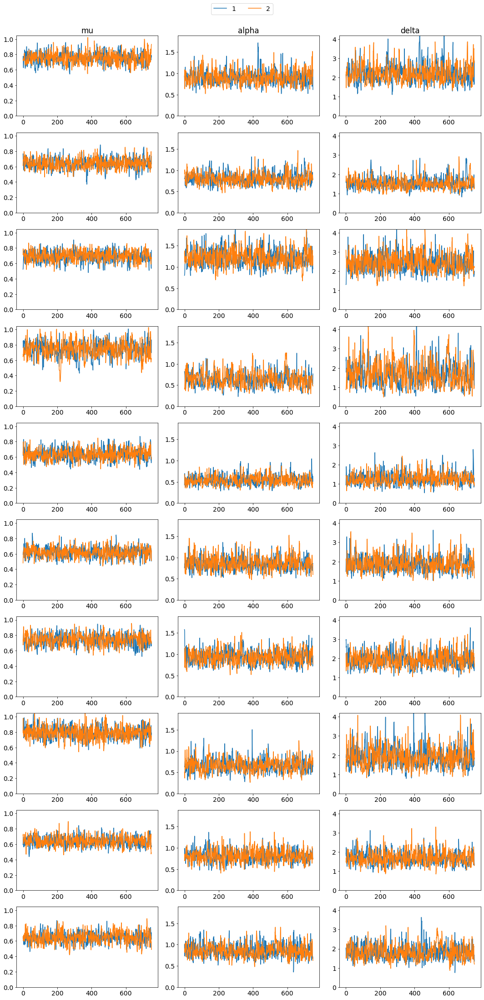

In [184]:
trace_plots(fits, param_strings)

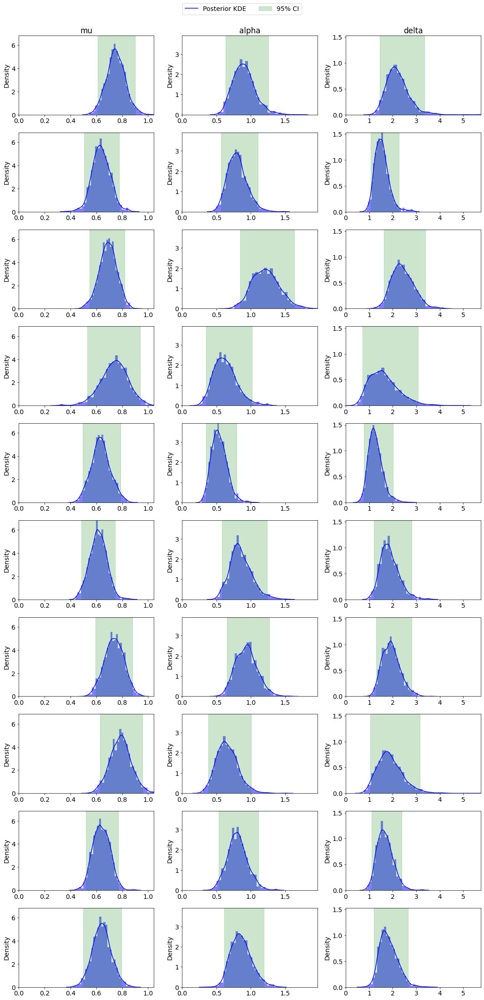

In [185]:
posterior_histograms(fits, param_strings)

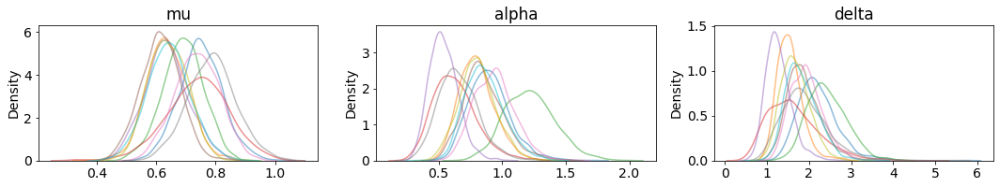

In [186]:
posterior_kdes_overlaid(fits, param_strings)

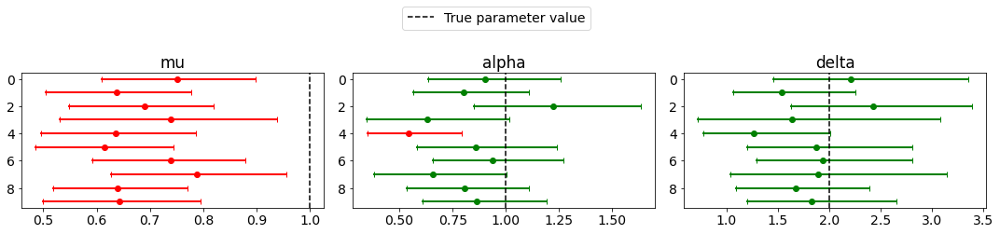

In [187]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_start=200

In [188]:
T_start=200

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [189]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

00:36:34 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation0
00:36:34 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:42:30 - cmdstanpy - INFO - CmdStan done processing.
00:42:30 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation1
00:42:30 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:48:40 - cmdstanpy - INFO - CmdStan done processing.
00:48:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation2
00:48:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:55:43 - cmdstanpy - INFO - CmdStan done processing.
00:55:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation3
00:55:43 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:01:26 - cmdstanpy - INFO - CmdStan done processing.
01:01:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation4
01:01:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:06:09 - cmdstanpy - INFO - CmdStan done processing.
01:06:09 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation5
01:06:09 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:11:01 - cmdstanpy - INFO - CmdStan done processing.
01:11:01 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation6
01:11:01 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:19:37 - cmdstanpy - INFO - CmdStan done processing.
01:19:37 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation7
01:19:37 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:24:53 - cmdstanpy - INFO - CmdStan done processing.



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation8


01:24:53 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation8
01:24:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:30:09 - cmdstanpy - INFO - CmdStan done processing.
01:30:09 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation9
01:30:09 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:35:43 - cmdstanpy - INFO - CmdStan done processing.


In [196]:
T_start=200
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

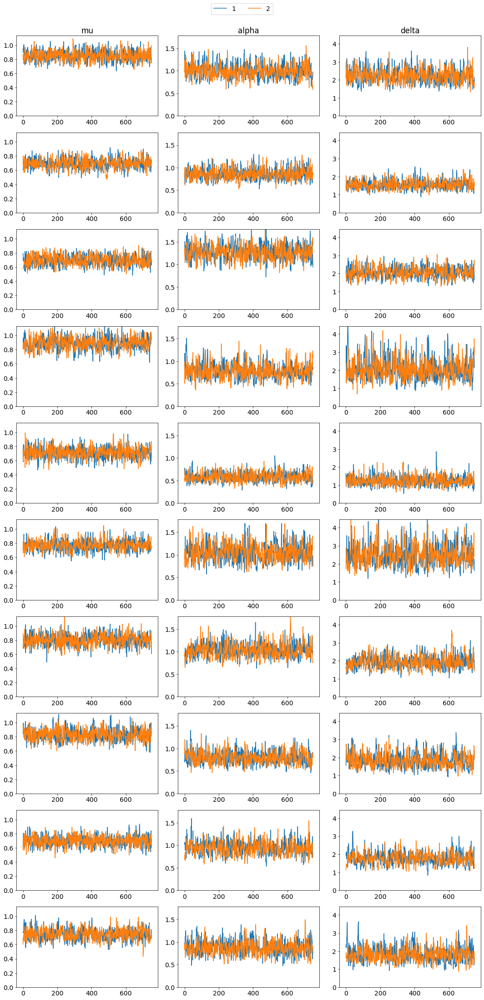

In [197]:
trace_plots(fits, param_strings)

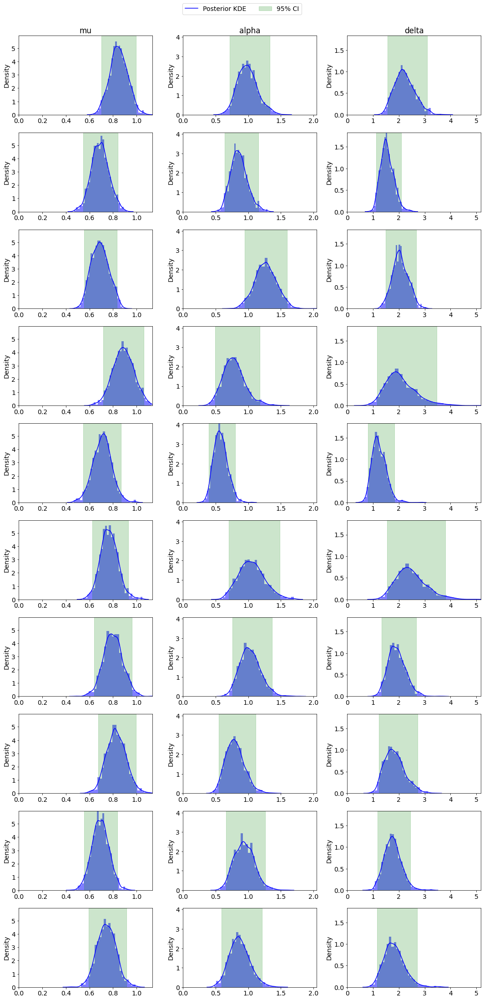

In [198]:
posterior_histograms(fits, param_strings)

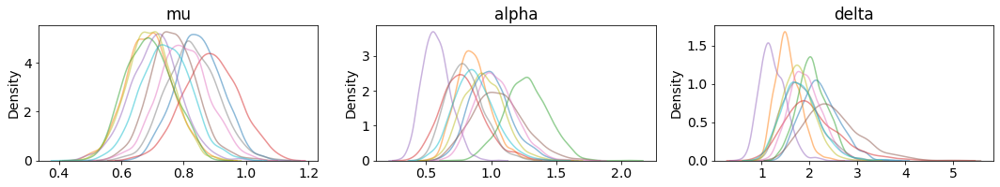

In [199]:
posterior_kdes_overlaid(fits, param_strings)

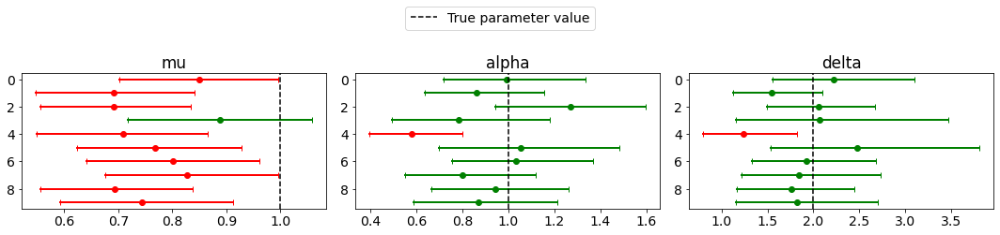

In [200]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_start=300

In [190]:
T_start=300

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [191]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

01:35:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation0
01:35:43 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:43:26 - cmdstanpy - INFO - CmdStan done processing.
01:43:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation1
01:43:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:51:46 - cmdstanpy - INFO - CmdStan done processing.
01:51:46 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation2
01:51:46 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:01:48 - cmdstanpy - INFO - CmdStan done processing.
02:01:49 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation3
02:01:49 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:10:03 - cmdstanpy - INFO - CmdStan done processing.
02:10:03 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation4
02:10:03 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:16:40 - cmdstanpy - INFO - CmdStan done processing.
02:16:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation5
02:16:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:23:55 - cmdstanpy - INFO - CmdStan done processing.
02:23:55 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation6
02:23:55 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:36:57 - cmdstanpy - INFO - CmdStan done processing.



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation7


02:36:58 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation7
02:36:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:44:51 - cmdstanpy - INFO - CmdStan done processing.
02:44:52 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation8
02:44:52 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:51:35 - cmdstanpy - INFO - CmdStan done processing.
02:51:36 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation9
02:51:36 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:58:43 - cmdstanpy - INFO - CmdStan done processing.


In [201]:
T_start=300
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

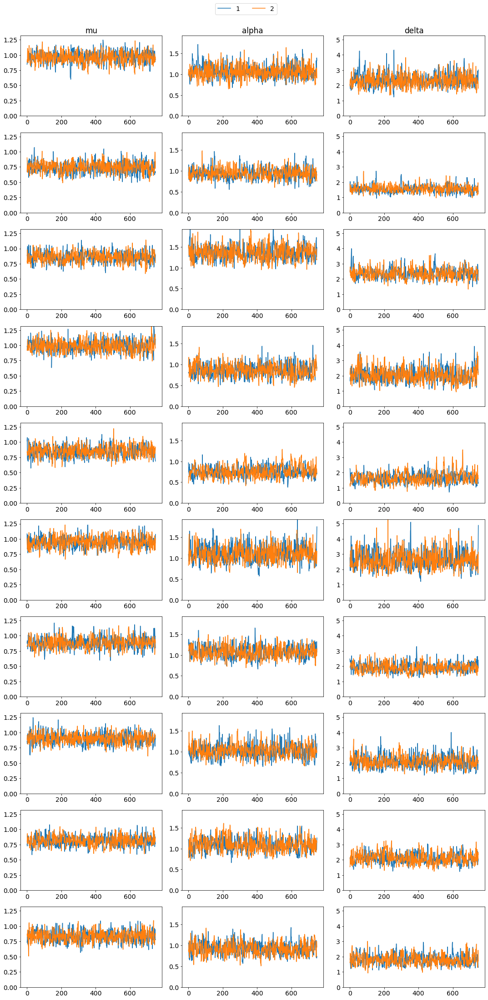

In [202]:
trace_plots(fits, param_strings)

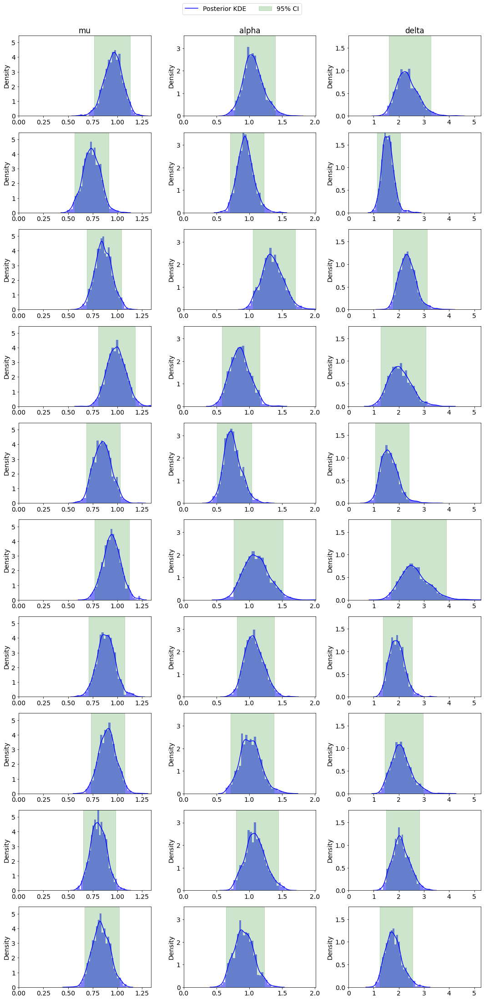

In [203]:
posterior_histograms(fits, param_strings)

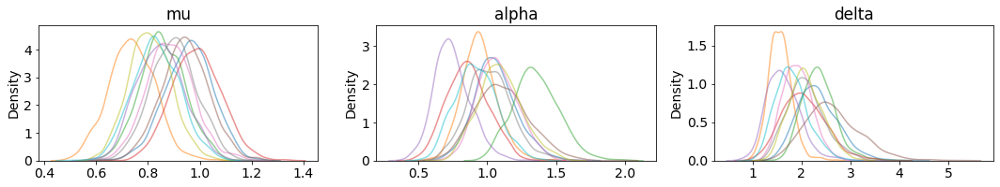

In [204]:
posterior_kdes_overlaid(fits, param_strings)

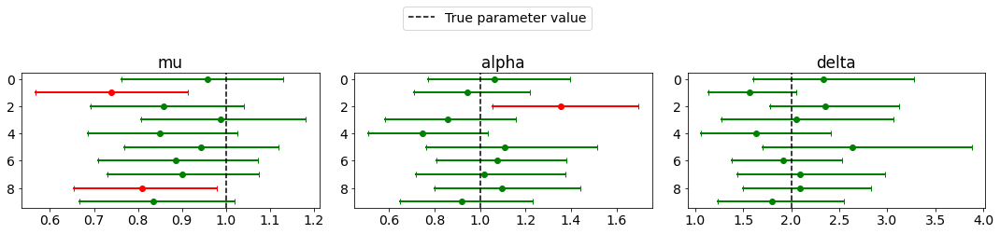

In [205]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_start=400

In [192]:
T_start=400

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [193]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation0


02:58:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation0
02:58:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:08:40 - cmdstanpy - INFO - CmdStan done processing.
03:08:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation1
03:08:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:19:53 - cmdstanpy - INFO - CmdStan done processing.
03:19:53 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation2
03:19:53 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:34:51 - cmdstanpy - INFO - CmdStan done processing.
03:34:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation3
03:34:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:45:26 - cmdstanpy - INFO - CmdStan done processing.
03:45:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation4
03:45:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:53:32 - cmdstanpy - INFO - CmdStan done processing.
03:53:33 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation5
03:53:33 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:03:50 - cmdstanpy - INFO - CmdStan done processing.
04:03:50 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation6
04:03:50 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:17:20 - cmdstanpy - INFO - CmdStan done processing.
04:17:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation7
04:17:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:29:18 - cmdstanpy - INFO - CmdStan done processing.
04:29:18 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation8
04:29:18 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:37:40 - cmdstanpy - INFO - CmdStan done processing.
04:37:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation9
04:37:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:47:59 - cmdstanpy - INFO - CmdStan done processing.


In [206]:
T_start=400
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

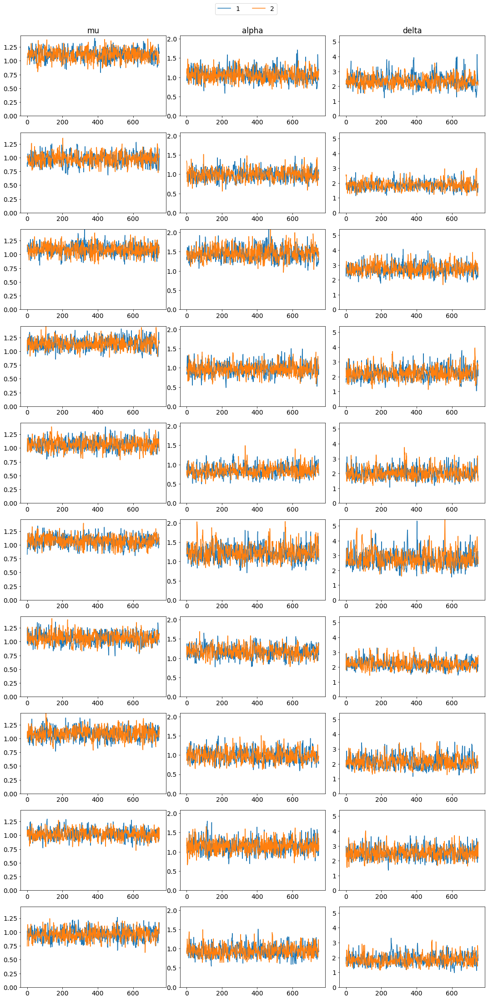

In [207]:
trace_plots(fits, param_strings)

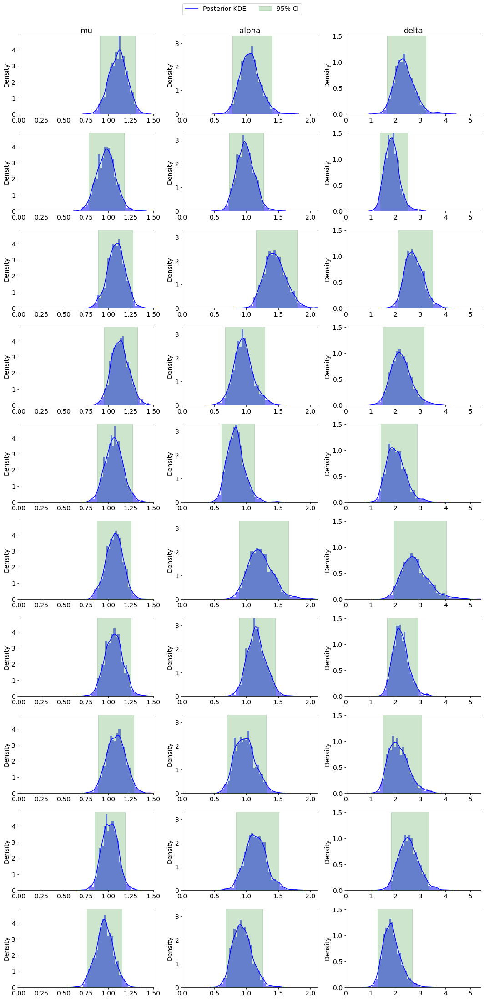

In [208]:
posterior_histograms(fits, param_strings)

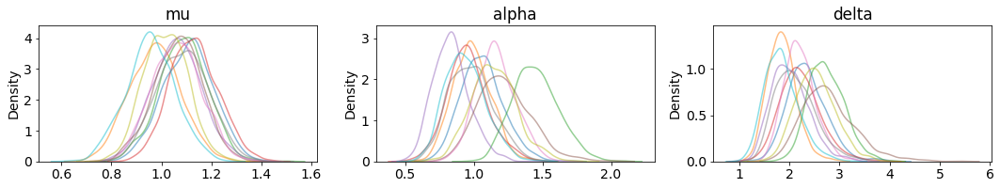

In [209]:
posterior_kdes_overlaid(fits, param_strings)

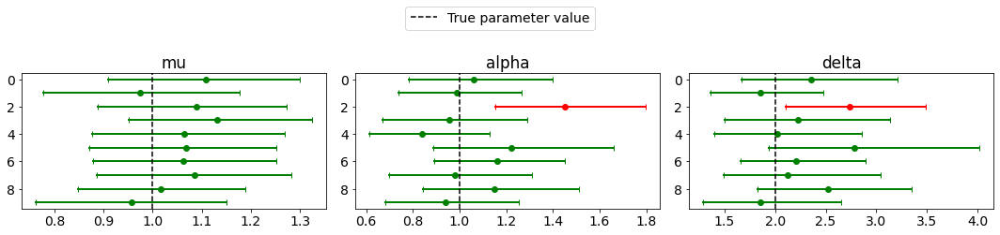

In [210]:
stacked_credible_intervals(fits, param_strings, [1,1,2])